In [1]:
import funcs
import mrsobs

import itertools
import numpy as np
from astropy.io import fits
from scipy.stats import norm
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

In [2]:
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
d2cMapDir = workDir+'notebooks/distortionMaps/'
lvl1path = workDir+'CV3_data/LVL1/'
lvl2path = workDir+'CV3_data/LVL2/'

band   = '1A'
# infile = 'NonLinearityCorrection_OutputParameters_CV3_MRS_RAD_14_Band{}.npy'.format(band)
infile = 'NonLinearityCorrection_OutputParameters_dic_CV3_MRS_RAD_14'

In [3]:
out_parameters_dic = funcs.load_obj(infile,path='obj/')# np.load(infile)
out_parameters = out_parameters_dic[band]

In [4]:
out_parameters.shape

(5, 1024, 1032)

In [5]:
d2cMaps = funcs.load_obj('d2cMaps_band{}_tr90pc'.format(band),path=d2cMapDir)
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )

# > Fit Bias Map

<IPython.core.display.Javascript object>


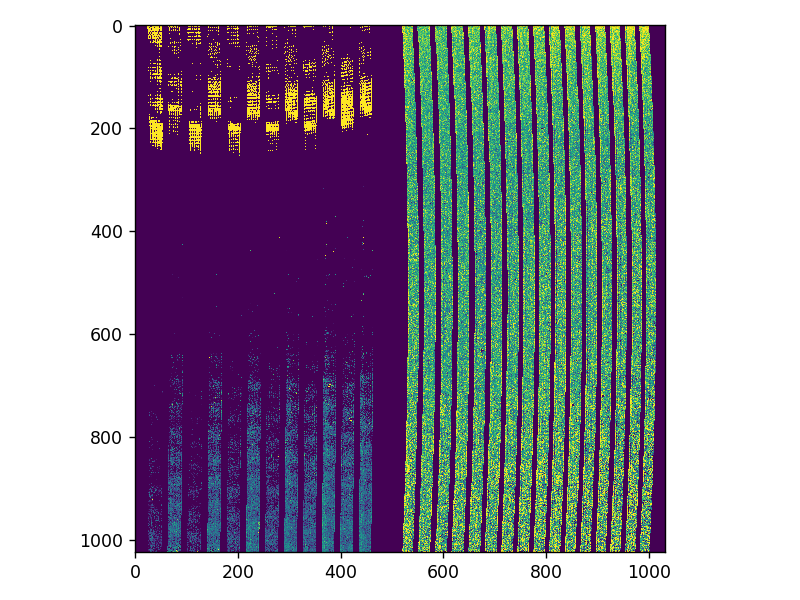

(1.02893189217454, 0.045675524461196396)


<IPython.core.display.Javascript object>


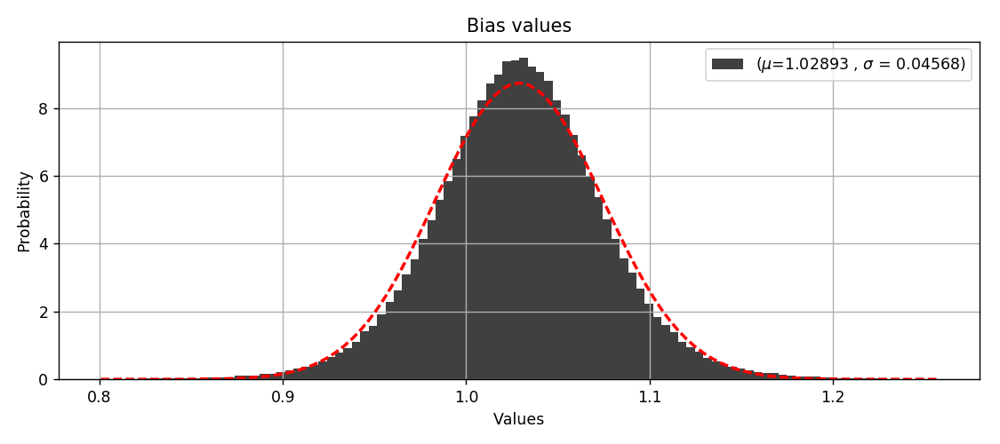

In [6]:
plt.figure()
plt.imshow(out_parameters[0,:,:],vmin=0.9,vmax=1.1)
plt.tight_layout()

(mu, sigma) = norm.fit(out_parameters[0,:,:][sel][(out_parameters[0,:,:][sel] > 0.8) & (out_parameters[0,:,:][sel] < 1.2)])
print (mu, sigma)

plt.figure(figsize=(9,4))
n, bins, patches = plt.hist(out_parameters[0,:,:][sel][(out_parameters[0,:,:][sel] > mu-5*sigma) & (out_parameters[0,:,:][sel] < mu+5*sigma)], 100, normed=1, facecolor='k', alpha=0.75,label=r'($\mu$={} , $\sigma$ = {})'.format(round(mu,5), round(sigma,5) ))
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Values')
plt.ylabel('Probability')
plt.title('Bias values')
plt.legend()
plt.grid(True)
plt.tight_layout()

### Single 2D polynomial fit for all slices at once

<IPython.core.display.Javascript object>


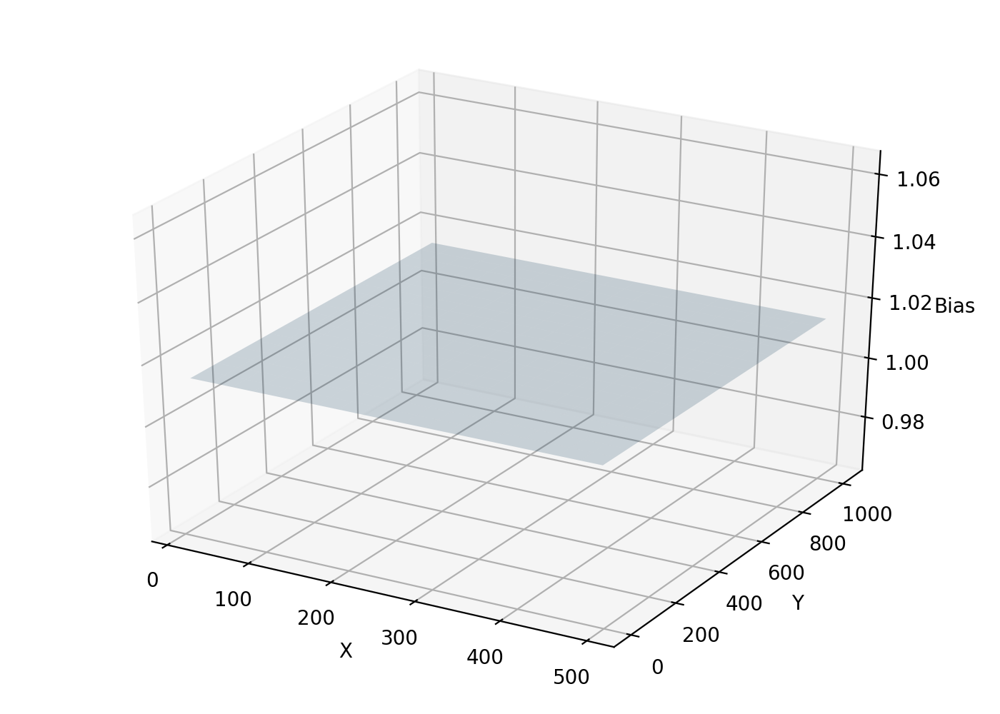

<IPython.core.display.Javascript object>


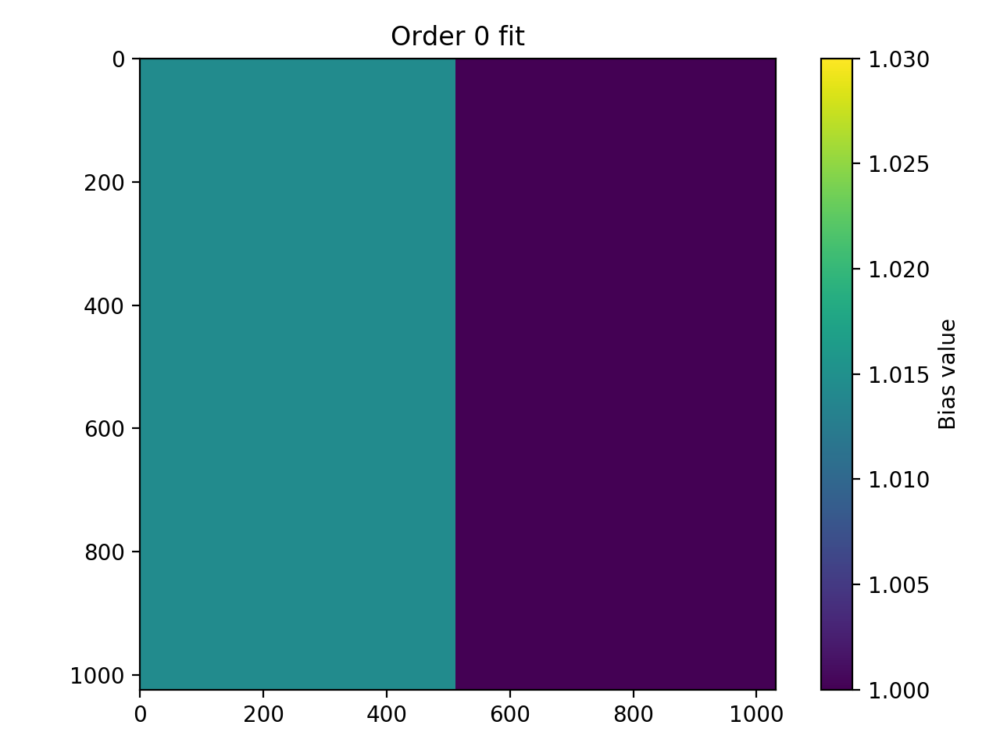

Order 0 fit bias value: 1.0145


In [8]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[0,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,0)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Bias')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_biasMap_allSlices_order0  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_biasMap_allSlices_order0[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 0 fit')
plt.imshow(new_biasMap_allSlices_order0,vmin=1,vmax=1.03)
clb = plt.colorbar()
clb.set_label('Bias value')
plt.tight_layout()

print 'Order 0 fit bias value: {}'.format(round(new_biasMap_allSlices_order0[100,100],4))

<IPython.core.display.Javascript object>


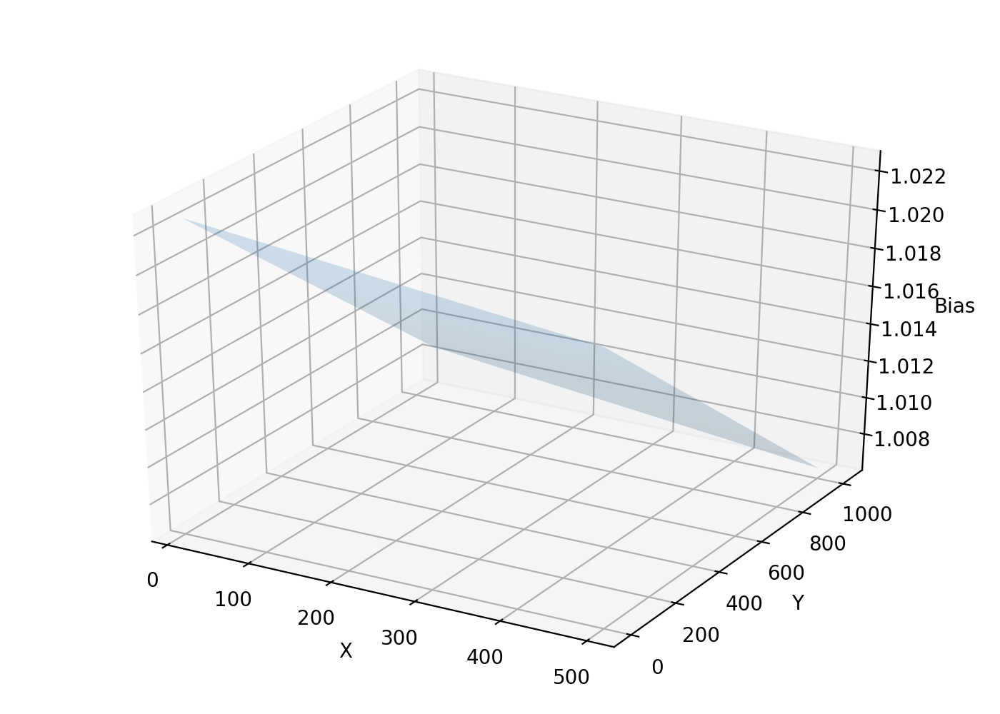

<IPython.core.display.Javascript object>


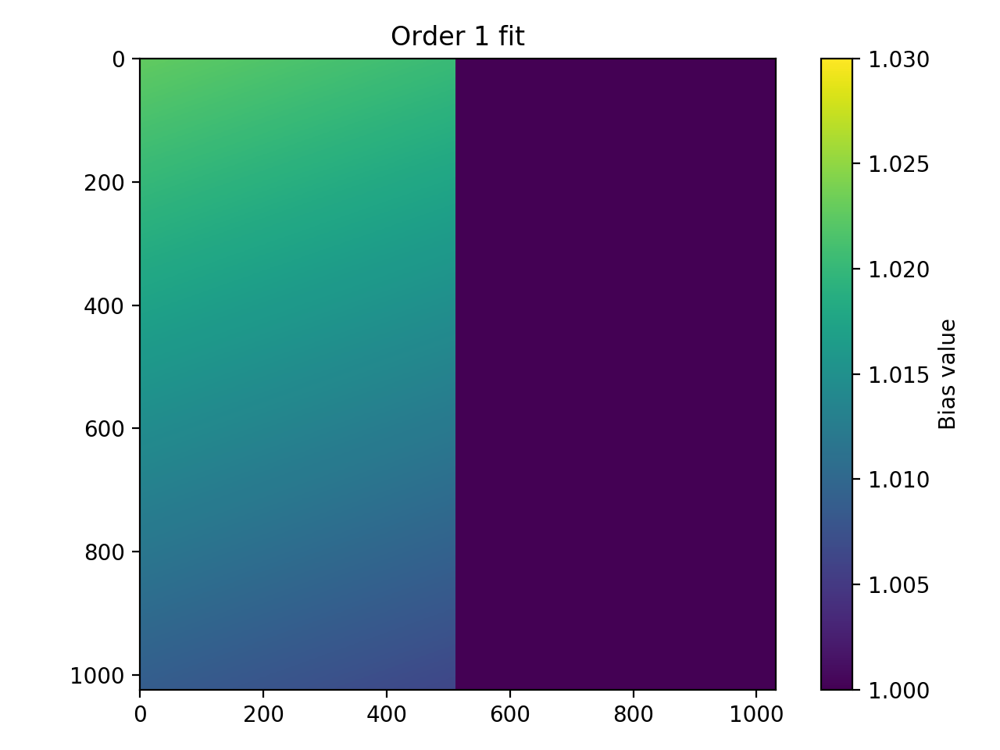

In [9]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[0,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Bias')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_biasMap_allSlices_order1  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_biasMap_allSlices_order1[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 1 fit')
plt.imshow(new_biasMap_allSlices_order1,vmin=1,vmax=1.03)
clb = plt.colorbar()
clb.set_label('Bias value')
plt.tight_layout()

### Fit order=2 polynomial in 2D

<IPython.core.display.Javascript object>


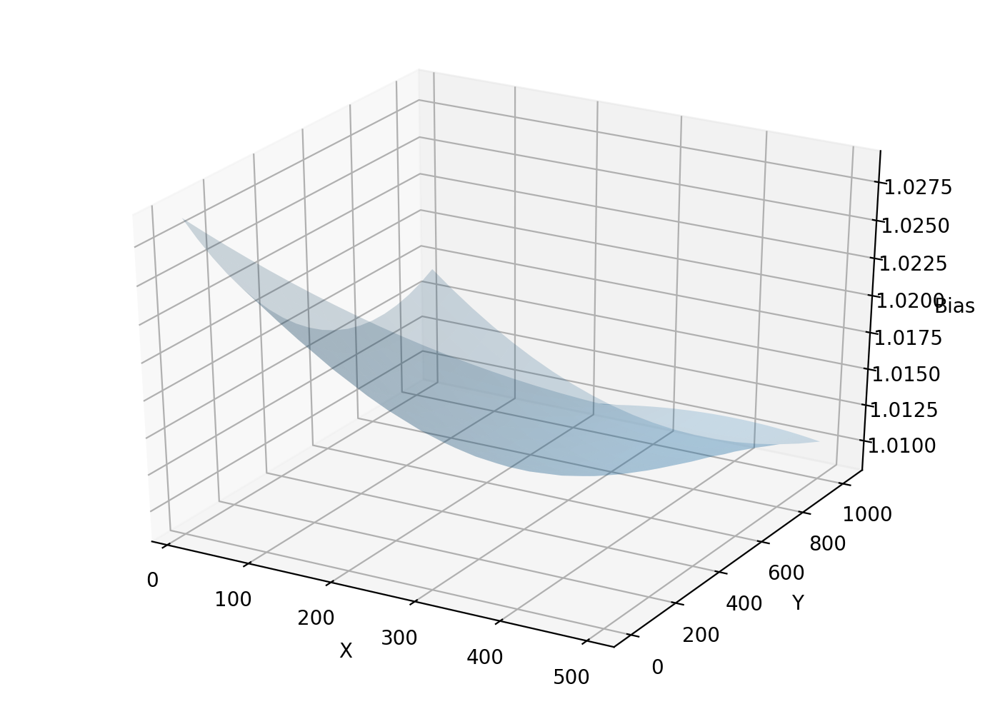

<IPython.core.display.Javascript object>


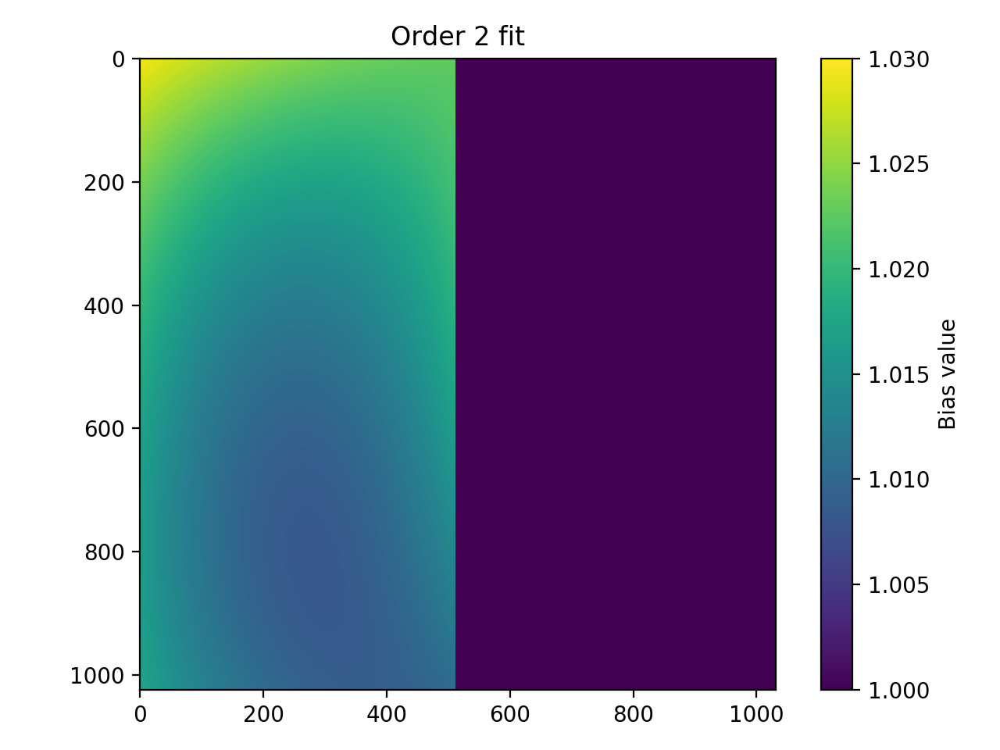

In [10]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[0,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Bias')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_biasMap_allSlices_order2  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_biasMap_allSlices_order2[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

# plot result
plt.figure()
plt.title('Order 2 fit')
plt.imshow(new_biasMap_allSlices_order2,vmin=1,vmax=1.03)
clb = plt.colorbar()
clb.set_label('Bias value')
plt.tight_layout()

### Fit order=3 polynomial in 2D

<IPython.core.display.Javascript object>


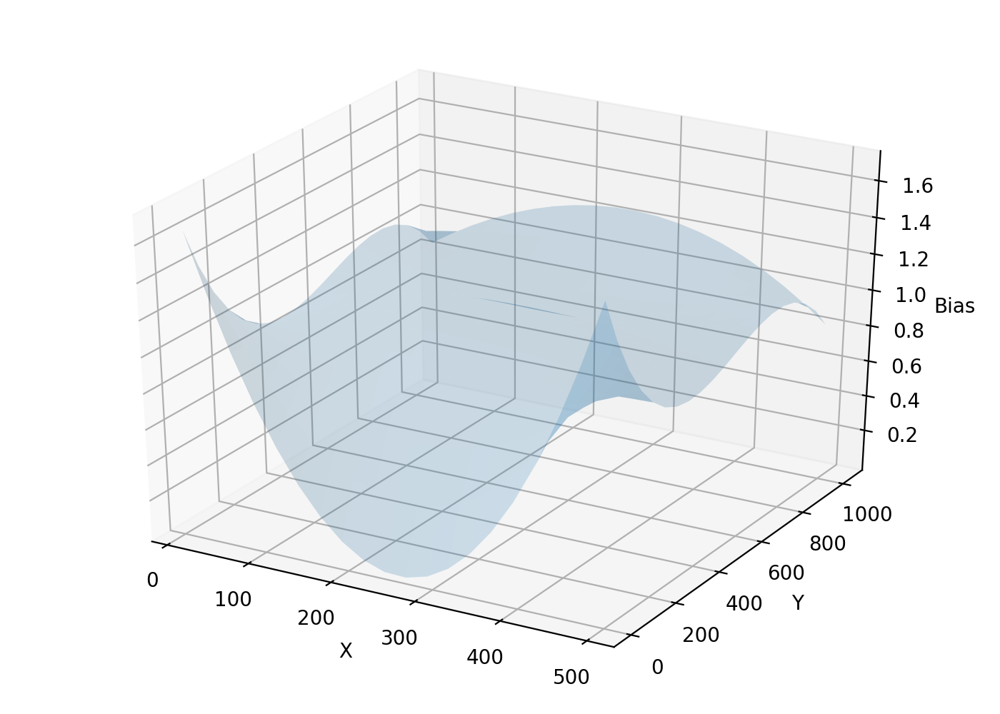

<IPython.core.display.Javascript object>


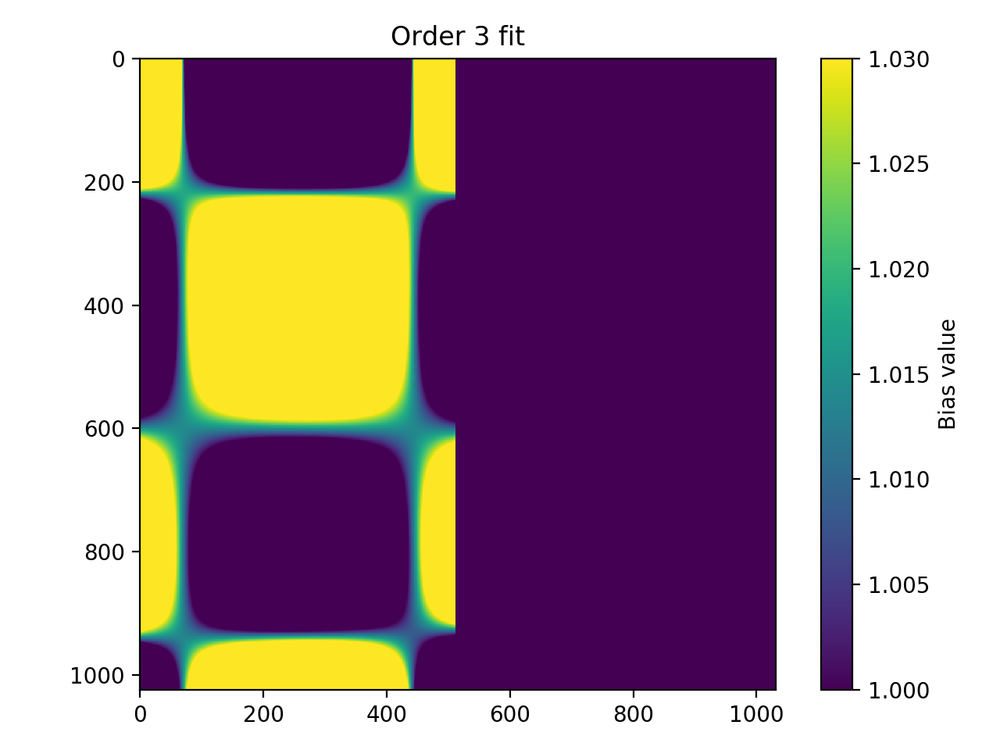

In [11]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[0,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,3)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Bias')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_biasMap_allSlices_order3  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_biasMap_allSlices_order3[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

# plot result
plt.figure()
plt.title('Order 3 fit')
plt.imshow(new_biasMap_allSlices_order3,vmin=1,vmax=1.03)
clb = plt.colorbar()
clb.set_label('Bias value')
plt.tight_layout()

### Compare residuals

(1.4940220823012927e-06, 0.03943002609493173)
(4.780025235783444e-06, 0.0394297210481682)
(5.382994671494204e-06, 0.03935866744536412)
(-0.005443259929360658, 0.0816227964666743)


<IPython.core.display.Javascript object>


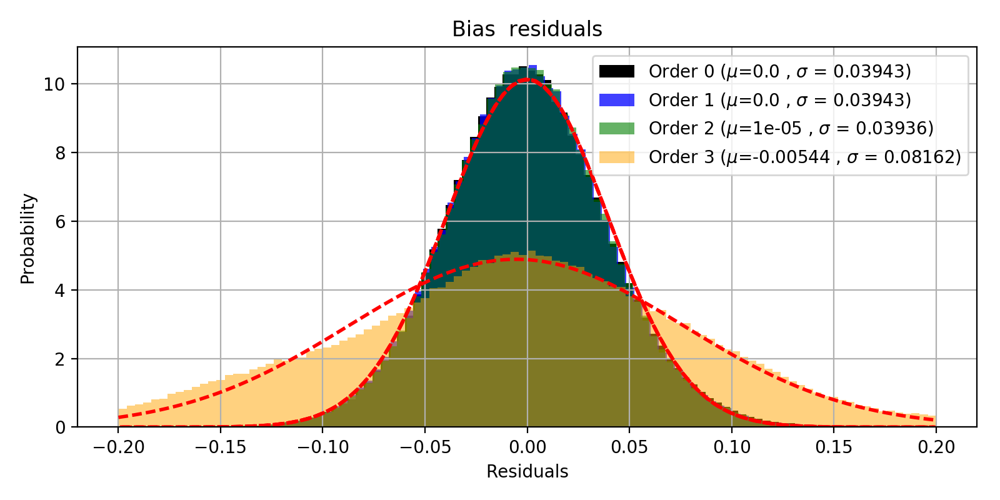

In [12]:
residuals_allSlices_order0 = out_parameters[0,:,:][sel]-new_biasMap_allSlices_order0[sel]
residuals_allSlices_order1 = out_parameters[0,:,:][sel]-new_biasMap_allSlices_order1[sel]
residuals_allSlices_order2 = out_parameters[0,:,:][sel]-new_biasMap_allSlices_order2[sel]
residuals_allSlices_order3 = out_parameters[0,:,:][sel]-new_biasMap_allSlices_order3[sel]

sel_allSlices_order0 = (residuals_allSlices_order0>=-0.2) & (residuals_allSlices_order0<=0.2)
sel_allSlices_order1 = (residuals_allSlices_order1>=-0.2) & (residuals_allSlices_order1<=0.2)
sel_allSlices_order2 = (residuals_allSlices_order2>=-0.2) & (residuals_allSlices_order2<=0.2)
sel_allSlices_order3 = (residuals_allSlices_order3>=-0.2) & (residuals_allSlices_order3<=0.2)

(mu_allSlices_order0, sigma_allSlices_order0) = norm.fit(residuals_allSlices_order1[sel_allSlices_order0])
(mu_allSlices_order1, sigma_allSlices_order1) = norm.fit(residuals_allSlices_order1[sel_allSlices_order1])
(mu_allSlices_order2, sigma_allSlices_order2) = norm.fit(residuals_allSlices_order2[sel_allSlices_order2])
(mu_allSlices_order3, sigma_allSlices_order3) = norm.fit(residuals_allSlices_order3[sel_allSlices_order3])

print (mu_allSlices_order0, sigma_allSlices_order0)
print (mu_allSlices_order1, sigma_allSlices_order1)
print (mu_allSlices_order2, sigma_allSlices_order2)
print (mu_allSlices_order3, sigma_allSlices_order3)

plt.figure(figsize=(8,4))
n_allSlices_order0, bins_allSlices_order0, patches_allSlices_order0 = plt.hist(residuals_allSlices_order0[sel_allSlices_order0], 100, normed=1, facecolor='k', alpha=1,label=r'Order 0 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order0,5), round(sigma_allSlices_order0,5) ))
n_allSlices_order1, bins_allSlices_order1, patches_allSlices_order1 = plt.hist(residuals_allSlices_order1[sel_allSlices_order1], 100, normed=1, facecolor='blue', alpha=0.75,label=r'Order 1 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order1,5), round(sigma_allSlices_order1,5) ))
n_allSlices_order2, bins_allSlices_order2, patches_allSlices_order2 = plt.hist(residuals_allSlices_order2[sel_allSlices_order2], 100, normed=1, facecolor='green', alpha=0.6,label='Order 2 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order2,5), round(sigma_allSlices_order2,5) ))
n_allSlices_order3, bins_allSlices_order3, patches_allSlices_order3 = plt.hist(residuals_allSlices_order3[sel_allSlices_order3], 100, normed=1, facecolor='orange', alpha=0.5,label='Order 3 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order3,5), round(sigma_allSlices_order3,5) ))
y_allSlices_order0 = mlab.normpdf(bins_allSlices_order0, mu_allSlices_order0, sigma_allSlices_order0)
y_allSlices_order1 = mlab.normpdf(bins_allSlices_order1, mu_allSlices_order1, sigma_allSlices_order1)
y_allSlices_order2 = mlab.normpdf(bins_allSlices_order2, mu_allSlices_order2, sigma_allSlices_order2)
y_allSlices_order3 = mlab.normpdf(bins_allSlices_order3, mu_allSlices_order3, sigma_allSlices_order3)
plt.plot(bins_allSlices_order0, y_allSlices_order0, 'r--', linewidth=2)
plt.plot(bins_allSlices_order1, y_allSlices_order1, 'r--', linewidth=2)
plt.plot(bins_allSlices_order2, y_allSlices_order2, 'r--', linewidth=2)
plt.plot(bins_allSlices_order3, y_allSlices_order3, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title('Bias  residuals')
plt.grid(True)
plt.legend()
plt.tight_layout()

# > Fit Linear Term Map

<IPython.core.display.Javascript object>


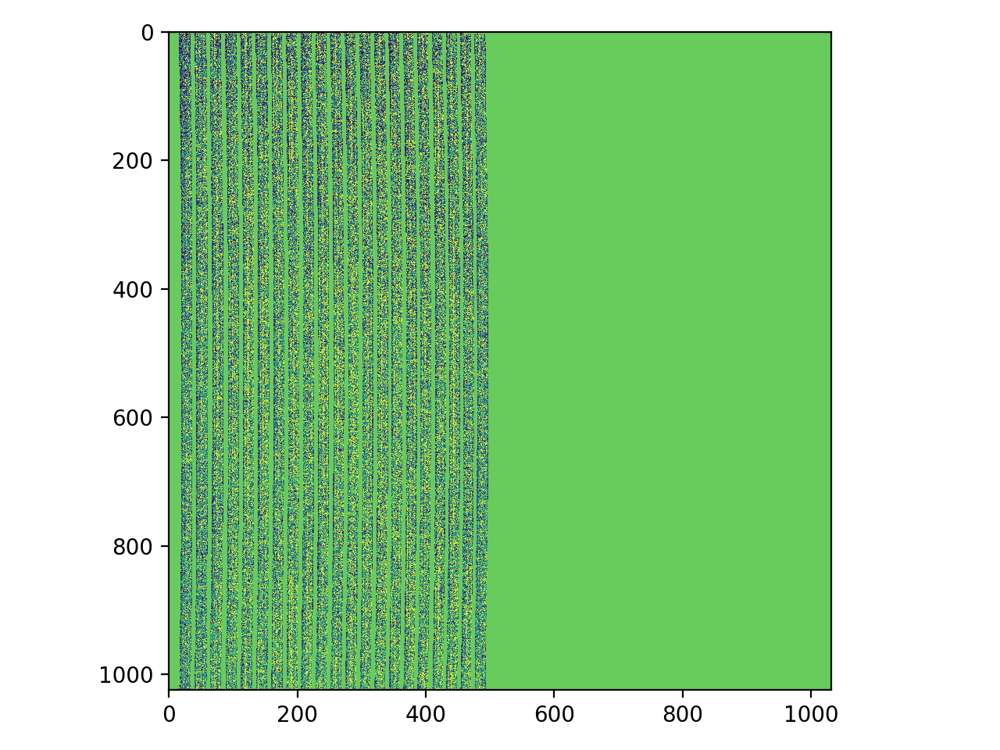

(-2.531443577960435e-06, 4.580891438888396e-06)


<IPython.core.display.Javascript object>


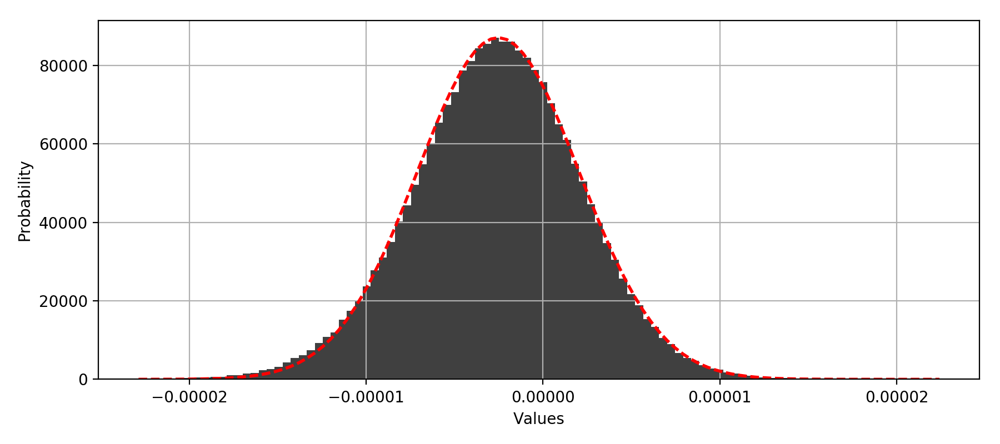

In [20]:
plt.figure()
plt.imshow(out_parameters[1,:,:]*1e6,vmin=-10,vmax=3)
plt.tight_layout()

(mu, sigma) = norm.fit(out_parameters[1,:,:][sel][(out_parameters[1,:,:][sel] > -15*1e-6) & (out_parameters[1,:,:][sel] < 15*1e-6)])
print (mu, sigma)

plt.figure(figsize=(9,4))
n, bins, patches = plt.hist(out_parameters[1,:,:][sel][(out_parameters[1,:,:][sel] > -5*sigma) & (out_parameters[1,:,:][sel] < 5*sigma)], 100, normed=1, facecolor='k', alpha=0.75)
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Values')
plt.ylabel('Probability')
plt.grid(True)
plt.tight_layout()

<IPython.core.display.Javascript object>


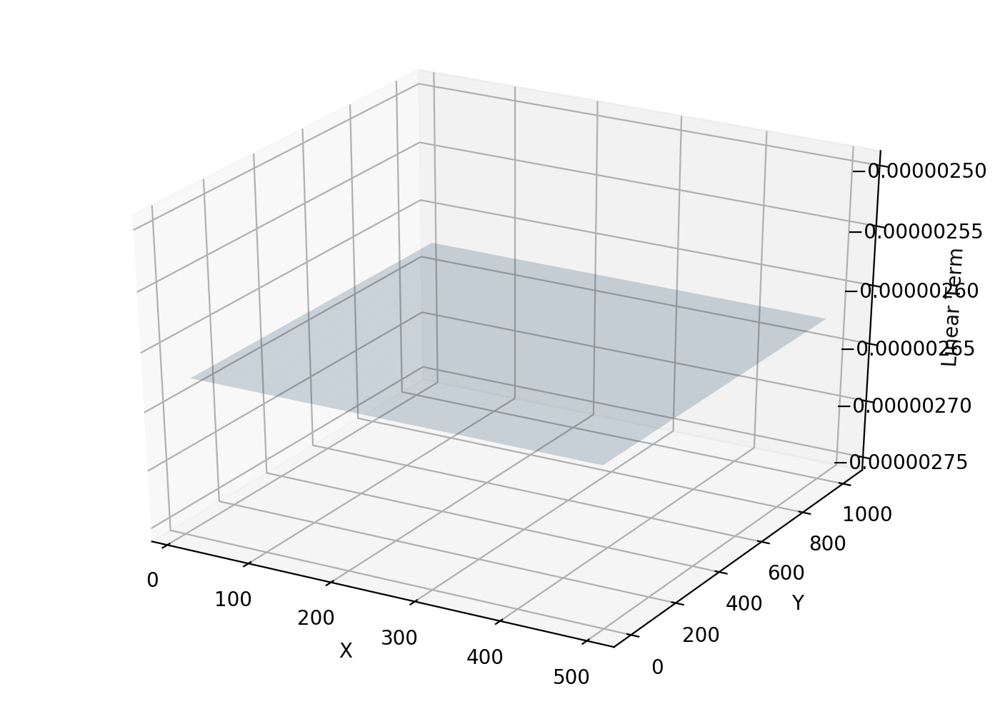

<IPython.core.display.Javascript object>


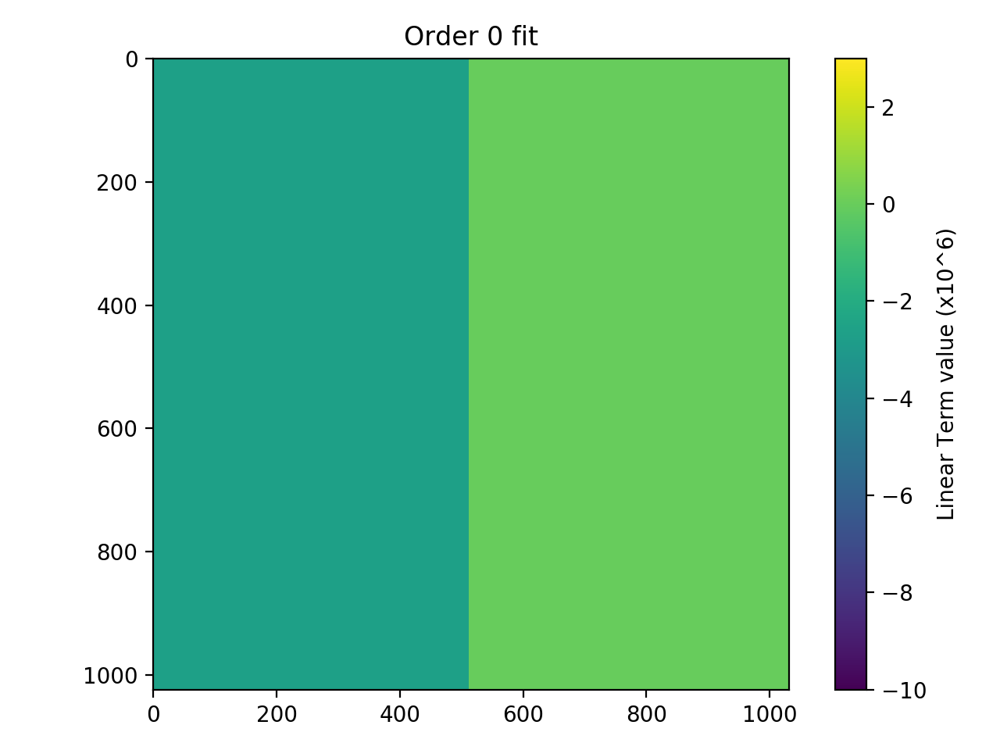

Order 0 fit linear term value: -2.62484360399e-06


In [23]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[1,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,0)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Linear Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_LinearTermMap_allSlices_order0  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_LinearTermMap_allSlices_order0[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 0 fit')
plt.imshow(new_LinearTermMap_allSlices_order0*1e6,vmin=-10,vmax=3)
clb = plt.colorbar()
clb.set_label('Linear Term value (x10^6)')
plt.tight_layout()

print 'Order 0 fit linear term value: {}'.format(new_LinearTermMap_allSlices_order0[100,100])

<IPython.core.display.Javascript object>


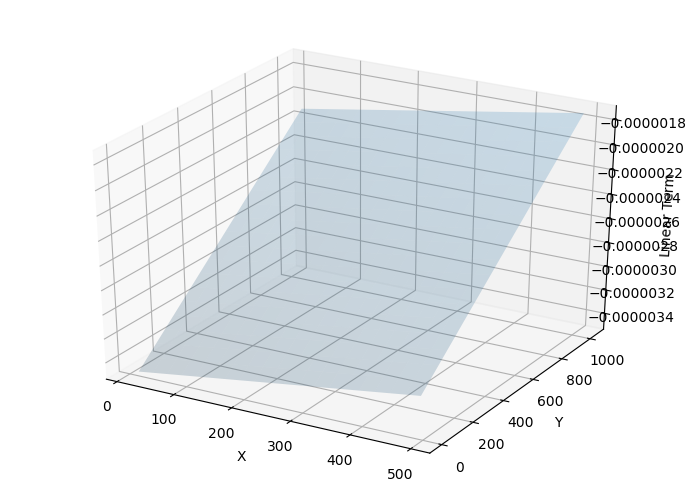

<IPython.core.display.Javascript object>


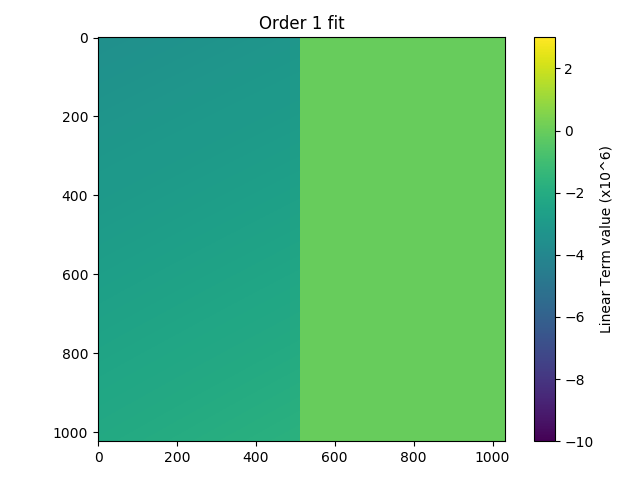

In [18]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[1,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Linear Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_LinearTermMap_allSlices_order1  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_LinearTermMap_allSlices_order1[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 1 fit')
plt.imshow(new_LinearTermMap_allSlices_order1*1e6,vmin=-10,vmax=3)
clb = plt.colorbar()
clb.set_label('Linear Term value (x10^6)')
plt.tight_layout()

<IPython.core.display.Javascript object>


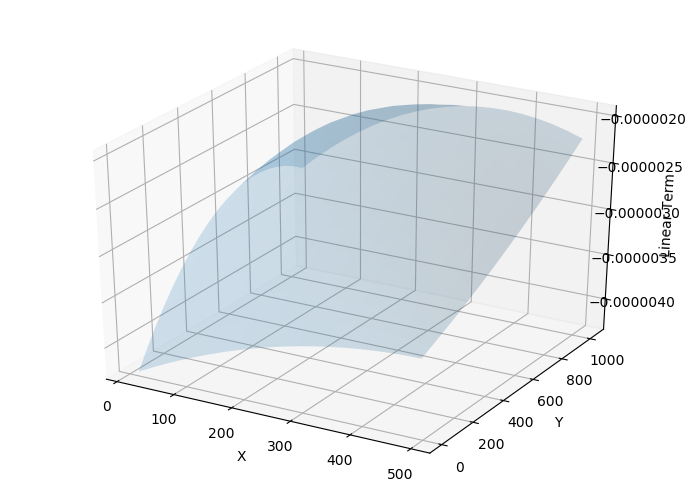

<IPython.core.display.Javascript object>


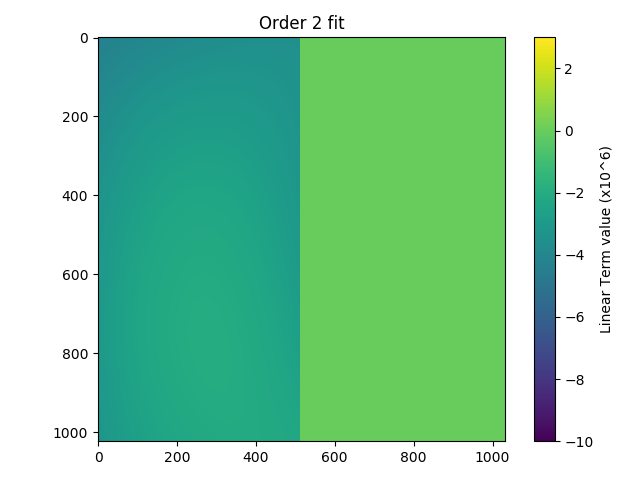

In [19]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[1,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Linear Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_LinearTermMap_allSlices_order2  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_LinearTermMap_allSlices_order2[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 2 fit')
plt.imshow(new_LinearTermMap_allSlices_order2*1e6,vmin=-10,vmax=3)
clb = plt.colorbar()
clb.set_label('Linear Term value (x10^6)')
plt.tight_layout()

<IPython.core.display.Javascript object>


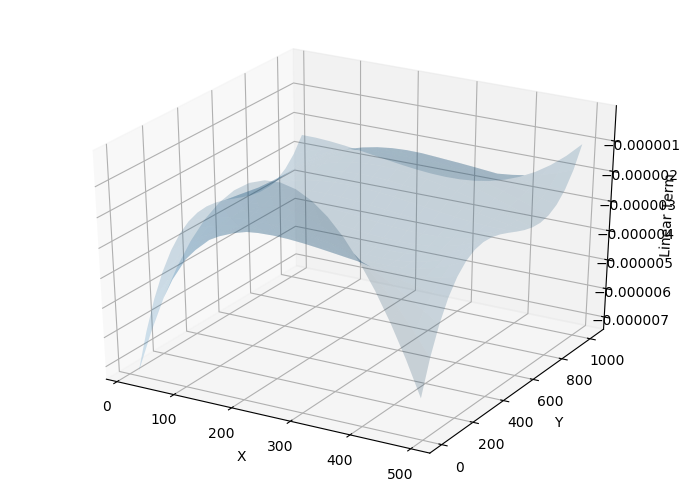

<IPython.core.display.Javascript object>


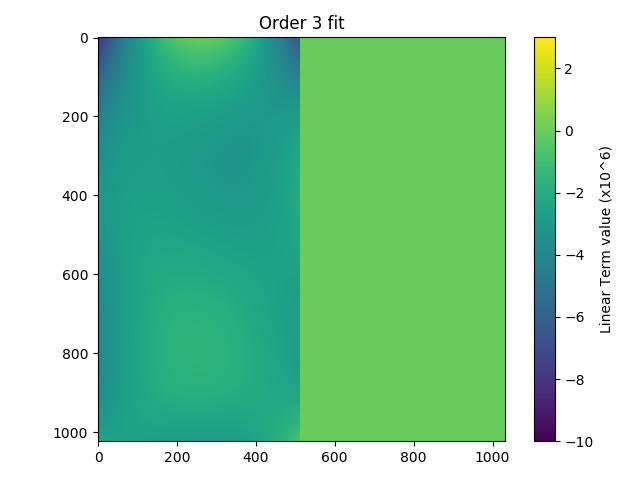

In [20]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[1,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,3)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Linear Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_LinearTermMap_allSlices_order3  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_LinearTermMap_allSlices_order3[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 3 fit')
plt.imshow(new_LinearTermMap_allSlices_order3*1e6,vmin=-10,vmax=3)
clb = plt.colorbar()
clb.set_label('Linear Term value (x10^6)')
plt.tight_layout()

(0.00013531911046107798, 0.4698500915526093)
(8.123979208753215e-05, 0.4698443240024928)
(4.9712069207153396e-05, 0.4690160239811024)
(-0.010585606000362392, 0.4729312632475454)


<IPython.core.display.Javascript object>


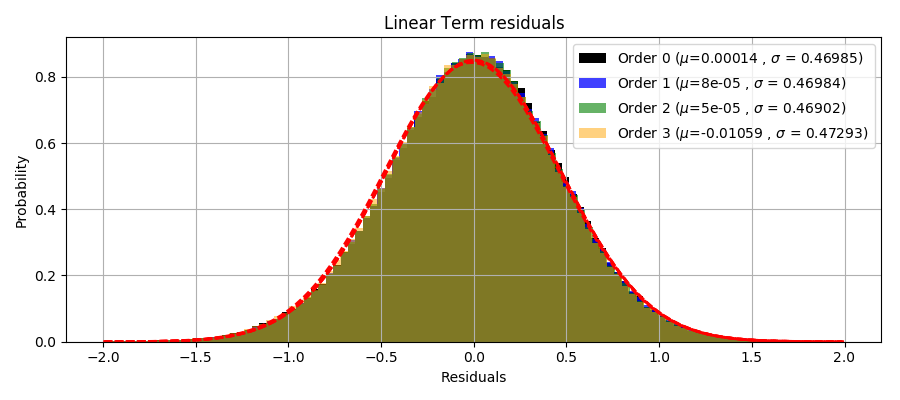

In [21]:
residuals_allSlices_order0 = (out_parameters[1,:,:][sel]-new_LinearTermMap_allSlices_order0[sel])*1e5
residuals_allSlices_order1 = (out_parameters[1,:,:][sel]-new_LinearTermMap_allSlices_order1[sel])*1e5
residuals_allSlices_order2 = (out_parameters[1,:,:][sel]-new_LinearTermMap_allSlices_order2[sel])*1e5
residuals_allSlices_order3 = (out_parameters[1,:,:][sel]-new_LinearTermMap_allSlices_order3[sel])*1e5

sel_allSlices_order0 = (residuals_allSlices_order0>=-2) & (residuals_allSlices_order0<=2)
sel_allSlices_order1 = (residuals_allSlices_order1>=-2) & (residuals_allSlices_order1<=2)
sel_allSlices_order2 = (residuals_allSlices_order2>=-2) & (residuals_allSlices_order2<=2)
sel_allSlices_order3 = (residuals_allSlices_order3>=-2) & (residuals_allSlices_order3<=2)

(mu_allSlices_order0, sigma_allSlices_order0) = norm.fit(residuals_allSlices_order1[sel_allSlices_order0])
(mu_allSlices_order1, sigma_allSlices_order1) = norm.fit(residuals_allSlices_order1[sel_allSlices_order1])
(mu_allSlices_order2, sigma_allSlices_order2) = norm.fit(residuals_allSlices_order2[sel_allSlices_order2])
(mu_allSlices_order3, sigma_allSlices_order3) = norm.fit(residuals_allSlices_order3[sel_allSlices_order3])

print (mu_allSlices_order0, sigma_allSlices_order0)
print (mu_allSlices_order1, sigma_allSlices_order1)
print (mu_allSlices_order2, sigma_allSlices_order2)
print (mu_allSlices_order3, sigma_allSlices_order3)

plt.figure(figsize=(9,4))
n_allSlices_order0, bins_allSlices_order0, patches_allSlices_order0 = plt.hist(residuals_allSlices_order0[sel_allSlices_order0], 100, normed=1, facecolor='k', alpha=1,label=r'Order 0 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order0,5), round(sigma_allSlices_order0,5) ))
n_allSlices_order1, bins_allSlices_order1, patches_allSlices_order1 = plt.hist(residuals_allSlices_order1[sel_allSlices_order1], 100, normed=1, facecolor='blue', alpha=0.75,label=r'Order 1 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order1,5), round(sigma_allSlices_order1,5) ))
n_allSlices_order2, bins_allSlices_order2, patches_allSlices_order2 = plt.hist(residuals_allSlices_order2[sel_allSlices_order2], 100, normed=1, facecolor='green', alpha=0.6,label='Order 2 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order2,5), round(sigma_allSlices_order2,5) ))
n_allSlices_order3, bins_allSlices_order3, patches_allSlices_order3 = plt.hist(residuals_allSlices_order3[sel_allSlices_order3], 100, normed=1, facecolor='orange', alpha=0.5,label='Order 3 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order3,5), round(sigma_allSlices_order3,5) ))
y_allSlices_order0 = mlab.normpdf(bins_allSlices_order0, mu_allSlices_order0, sigma_allSlices_order0)
y_allSlices_order1 = mlab.normpdf(bins_allSlices_order1, mu_allSlices_order1, sigma_allSlices_order1)
y_allSlices_order2 = mlab.normpdf(bins_allSlices_order2, mu_allSlices_order2, sigma_allSlices_order2)
y_allSlices_order3 = mlab.normpdf(bins_allSlices_order3, mu_allSlices_order3, sigma_allSlices_order3)
plt.plot(bins_allSlices_order0, y_allSlices_order0, 'r--', linewidth=2)
plt.plot(bins_allSlices_order1, y_allSlices_order1, 'r--', linewidth=2)
plt.plot(bins_allSlices_order2, y_allSlices_order2, 'r--', linewidth=2)
plt.plot(bins_allSlices_order3, y_allSlices_order3, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title('Linear Term residuals')
plt.grid(True)
plt.legend()
plt.tight_layout()

# > Fit Quadratic Term Map

<IPython.core.display.Javascript object>


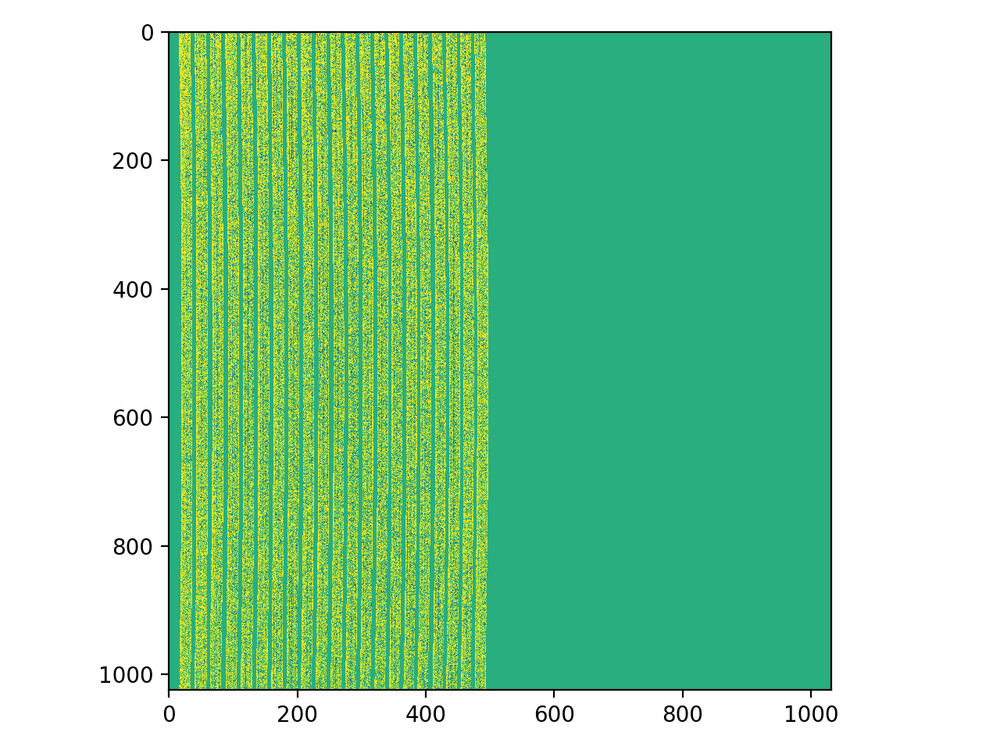

(1.620153635389005e-10, 1.981159205922178e-10)


<IPython.core.display.Javascript object>


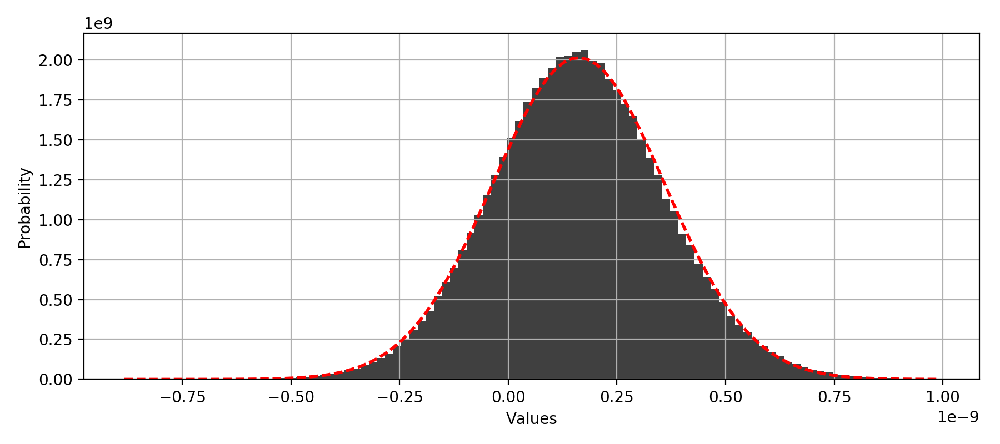

In [24]:
plt.figure()
plt.imshow(out_parameters[2,:,:]*1e10,vmin=-5,vmax=3)
plt.tight_layout()

(mu, sigma) = norm.fit(out_parameters[2,:,:][sel][(out_parameters[2,:,:][sel] > -5*1e-10) & (out_parameters[2,:,:][sel] < 10*1e-10)])
print (mu, sigma)

plt.figure(figsize=(9,4))
n, bins, patches = plt.hist(out_parameters[2,:,:][sel][(out_parameters[2,:,:][sel] > -5*sigma) & (out_parameters[2,:,:][sel] < 5*sigma)], 100, normed=1, facecolor='k', alpha=0.75)
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Values')
plt.ylabel('Probability')
plt.grid(True)
plt.tight_layout()

<IPython.core.display.Javascript object>


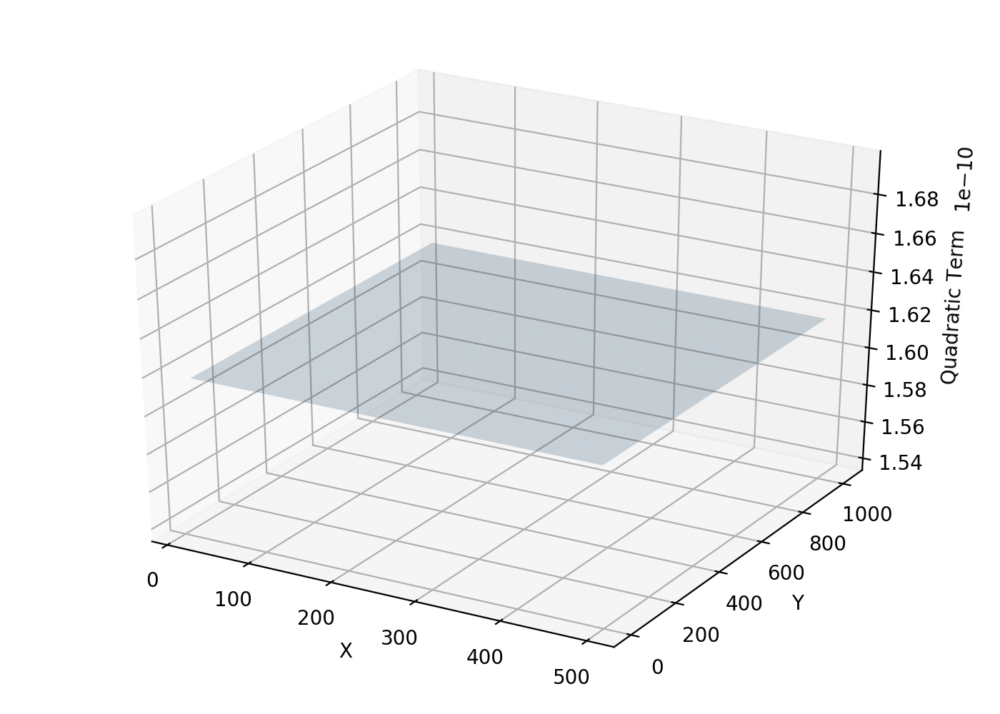

<IPython.core.display.Javascript object>


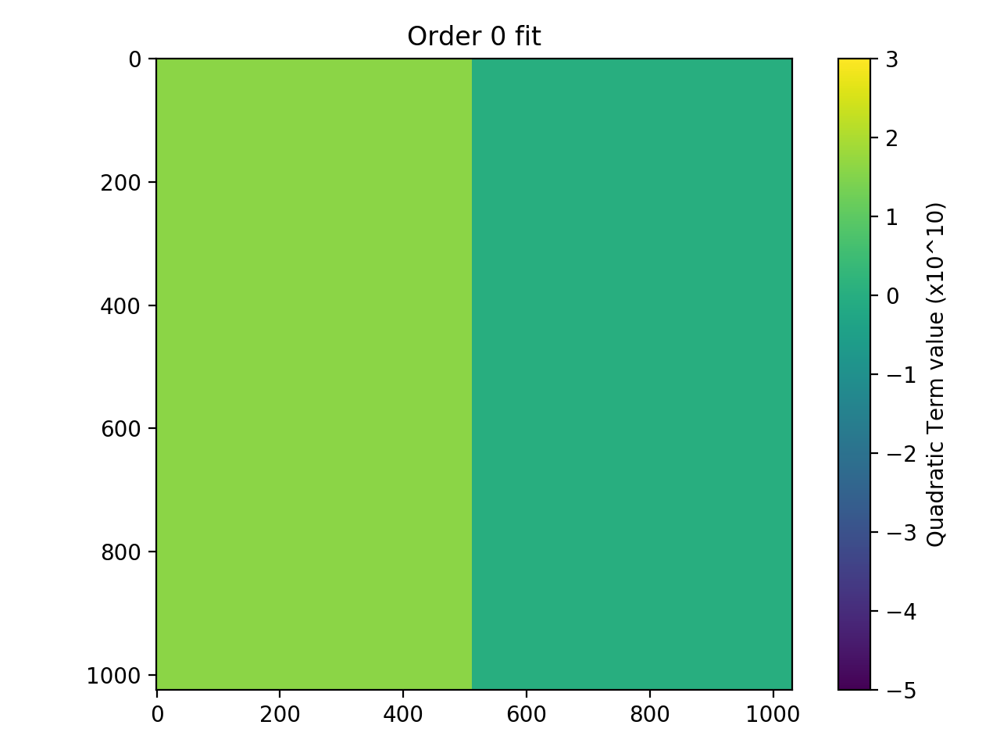

Order 0 fit quadratic term value: 1.61769947986e-10


In [26]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[2,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,0)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Quadratic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_QuadraticTermMap_allSlices_order0  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_QuadraticTermMap_allSlices_order0[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 0 fit')
plt.imshow(new_QuadraticTermMap_allSlices_order0*1e10,vmin=-5,vmax=3)
clb = plt.colorbar()
clb.set_label('Quadratic Term value (x10^10)')
plt.tight_layout()

print 'Order 0 fit quadratic term value: {}'.format(new_QuadraticTermMap_allSlices_order0[100,100])

<IPython.core.display.Javascript object>


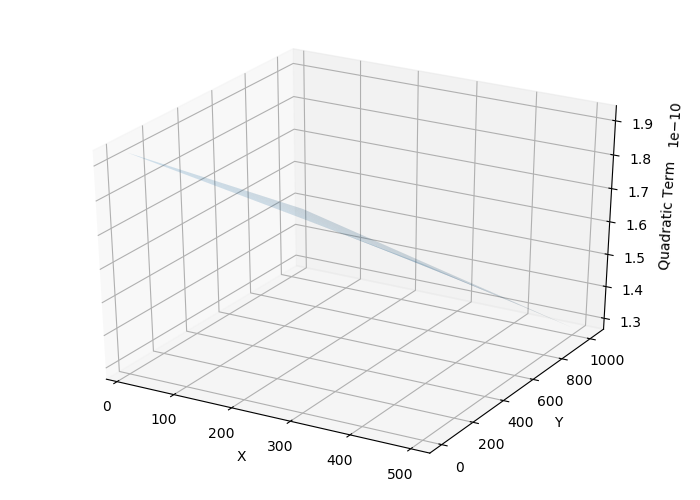

<IPython.core.display.Javascript object>


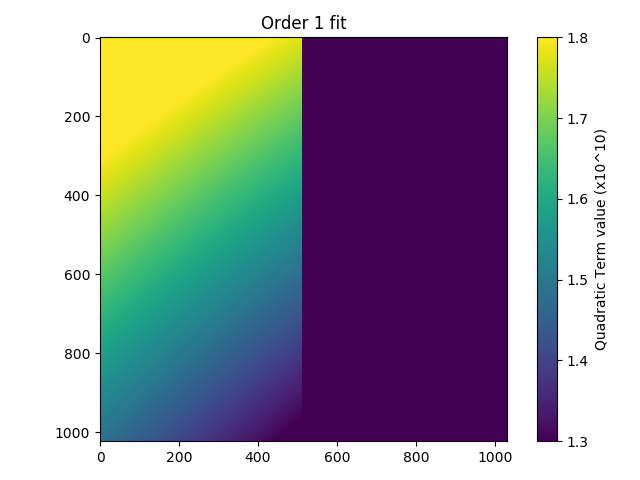

In [49]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[2,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Quadratic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_QuadraticTermMap_allSlices_order1  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_QuadraticTermMap_allSlices_order1[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 1 fit')
plt.imshow(new_QuadraticTermMap_allSlices_order1*1e10,vmin=1.3,vmax=1.8)
clb = plt.colorbar()
clb.set_label('Quadratic Term value (x10^10)')
plt.tight_layout()

<IPython.core.display.Javascript object>


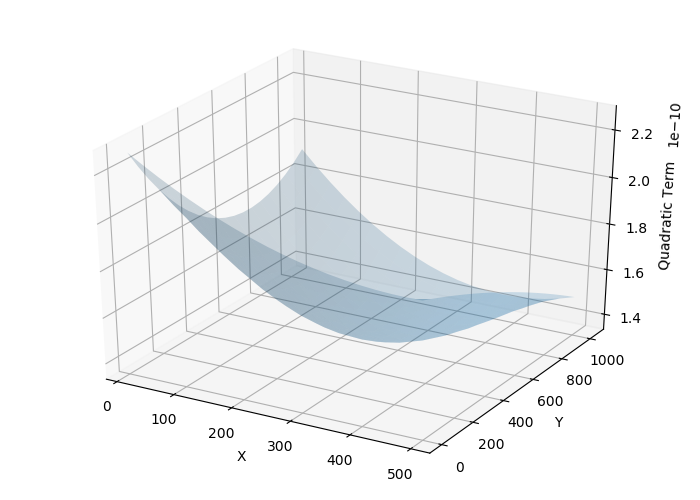

<IPython.core.display.Javascript object>


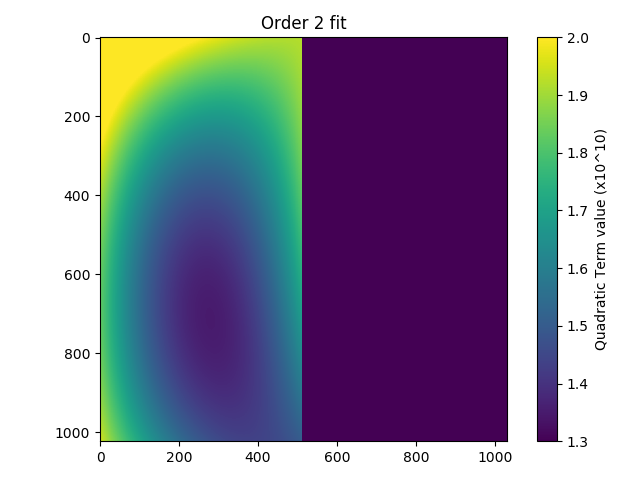

In [50]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[2,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Quadratic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_QuadraticTermMap_allSlices_order2  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_QuadraticTermMap_allSlices_order2[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 2 fit')
plt.imshow(new_QuadraticTermMap_allSlices_order2*1e10,vmin=1.3,vmax=2)
clb = plt.colorbar()
clb.set_label('Quadratic Term value (x10^10)')
plt.tight_layout()

<IPython.core.display.Javascript object>


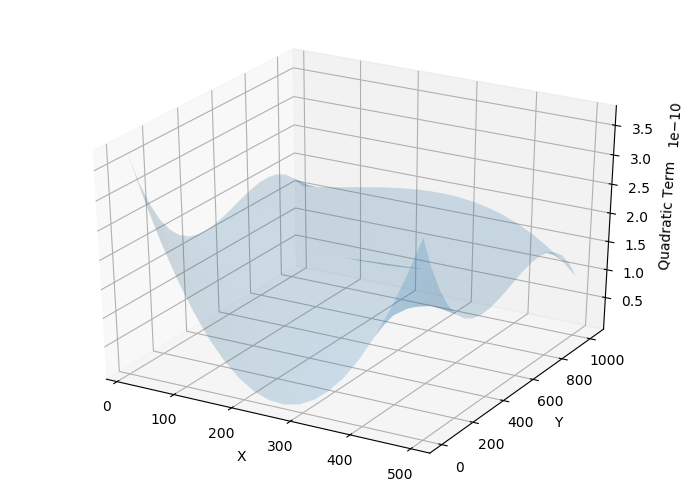

<IPython.core.display.Javascript object>


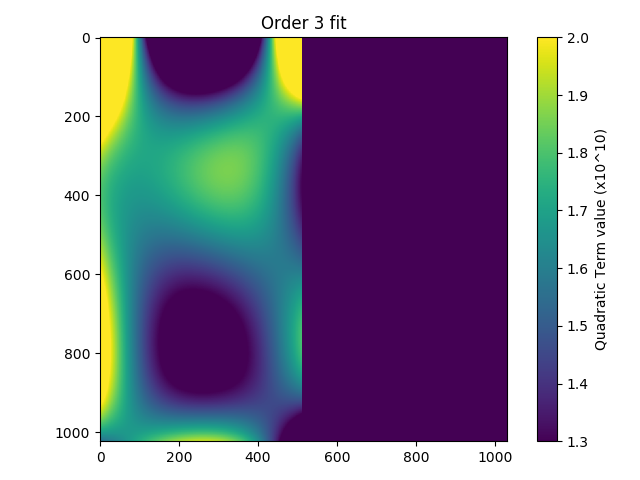

In [51]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[2,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,3)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Quadratic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_QuadraticTermMap_allSlices_order3  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_QuadraticTermMap_allSlices_order3[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 3 fit')
plt.imshow(new_QuadraticTermMap_allSlices_order3*1e10,vmin=1.3,vmax=2)
clb = plt.colorbar()
clb.set_label('Quadratic Term value (x10^10)')
plt.tight_layout()

(-0.0013227060986668883, 1.9797955165553829)
(-0.0011085587219877735, 1.9797714896200227)
(-0.001062517041843405, 1.9760086172680789)
(0.05523446252255977, 2.0022344086718635)


<IPython.core.display.Javascript object>


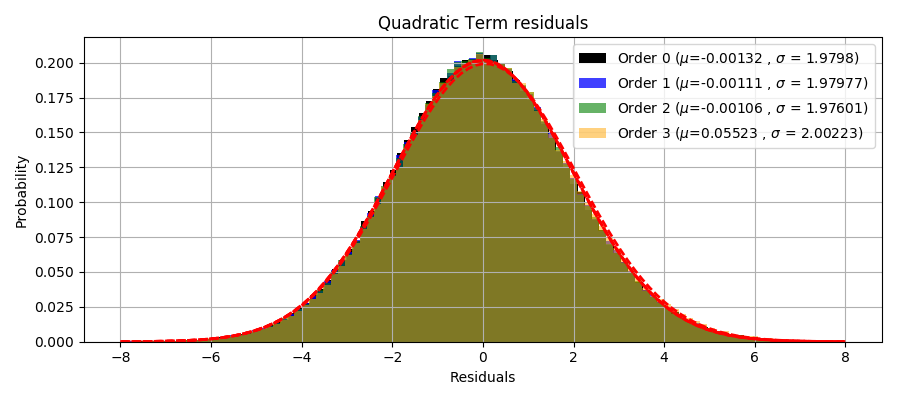

In [52]:
residuals_allSlices_order0 = (out_parameters[2,:,:][sel]-new_QuadraticTermMap_allSlices_order0[sel])*1e10
residuals_allSlices_order1 = (out_parameters[2,:,:][sel]-new_QuadraticTermMap_allSlices_order1[sel])*1e10
residuals_allSlices_order2 = (out_parameters[2,:,:][sel]-new_QuadraticTermMap_allSlices_order2[sel])*1e10
residuals_allSlices_order3 = (out_parameters[2,:,:][sel]-new_QuadraticTermMap_allSlices_order3[sel])*1e10

sel_allSlices_order0 = (residuals_allSlices_order0>=-8) & (residuals_allSlices_order0<=8)
sel_allSlices_order1 = (residuals_allSlices_order1>=-8) & (residuals_allSlices_order1<=8)
sel_allSlices_order2 = (residuals_allSlices_order2>=-8) & (residuals_allSlices_order2<=8)
sel_allSlices_order3 = (residuals_allSlices_order3>=-8) & (residuals_allSlices_order3<=8)

(mu_allSlices_order0, sigma_allSlices_order0) = norm.fit(residuals_allSlices_order1[sel_allSlices_order0])
(mu_allSlices_order1, sigma_allSlices_order1) = norm.fit(residuals_allSlices_order1[sel_allSlices_order1])
(mu_allSlices_order2, sigma_allSlices_order2) = norm.fit(residuals_allSlices_order2[sel_allSlices_order2])
(mu_allSlices_order3, sigma_allSlices_order3) = norm.fit(residuals_allSlices_order3[sel_allSlices_order3])

print (mu_allSlices_order0, sigma_allSlices_order0)
print (mu_allSlices_order1, sigma_allSlices_order1)
print (mu_allSlices_order2, sigma_allSlices_order2)
print (mu_allSlices_order3, sigma_allSlices_order3)

plt.figure(figsize=(9,4))
n_allSlices_order0, bins_allSlices_order0, patches_allSlices_order0 = plt.hist(residuals_allSlices_order0[sel_allSlices_order0], 100, normed=1, facecolor='k', alpha=1,label=r'Order 0 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order0,5), round(sigma_allSlices_order0,5) ))
n_allSlices_order1, bins_allSlices_order1, patches_allSlices_order1 = plt.hist(residuals_allSlices_order1[sel_allSlices_order1], 100, normed=1, facecolor='blue', alpha=0.75,label=r'Order 1 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order1,5), round(sigma_allSlices_order1,5) ))
n_allSlices_order2, bins_allSlices_order2, patches_allSlices_order2 = plt.hist(residuals_allSlices_order2[sel_allSlices_order2], 100, normed=1, facecolor='green', alpha=0.6,label='Order 2 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order2,5), round(sigma_allSlices_order2,5) ))
n_allSlices_order3, bins_allSlices_order3, patches_allSlices_order3 = plt.hist(residuals_allSlices_order3[sel_allSlices_order3], 100, normed=1, facecolor='orange', alpha=0.5,label='Order 3 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order3,5), round(sigma_allSlices_order3,5) ))
y_allSlices_order0 = mlab.normpdf(bins_allSlices_order0, mu_allSlices_order0, sigma_allSlices_order0)
y_allSlices_order1 = mlab.normpdf(bins_allSlices_order1, mu_allSlices_order1, sigma_allSlices_order1)
y_allSlices_order2 = mlab.normpdf(bins_allSlices_order2, mu_allSlices_order2, sigma_allSlices_order2)
y_allSlices_order3 = mlab.normpdf(bins_allSlices_order3, mu_allSlices_order3, sigma_allSlices_order3)
plt.plot(bins_allSlices_order0, y_allSlices_order0, 'r--', linewidth=2)
plt.plot(bins_allSlices_order1, y_allSlices_order1, 'r--', linewidth=2)
plt.plot(bins_allSlices_order2, y_allSlices_order2, 'r--', linewidth=2)
plt.plot(bins_allSlices_order3, y_allSlices_order3, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title('Quadratic Term residuals')
plt.grid(True)
plt.legend()
plt.tight_layout()

# > Fit Cubic Term Map

<IPython.core.display.Javascript object>


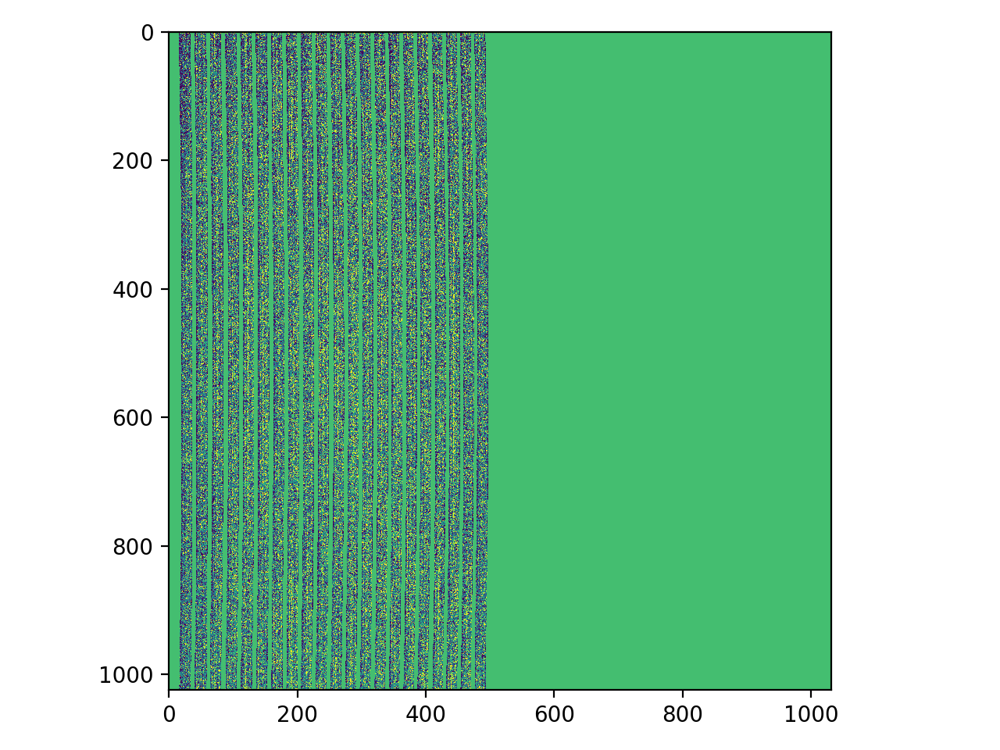

(-2.5645447047951644e-15, 3.595424628570081e-15)


<IPython.core.display.Javascript object>


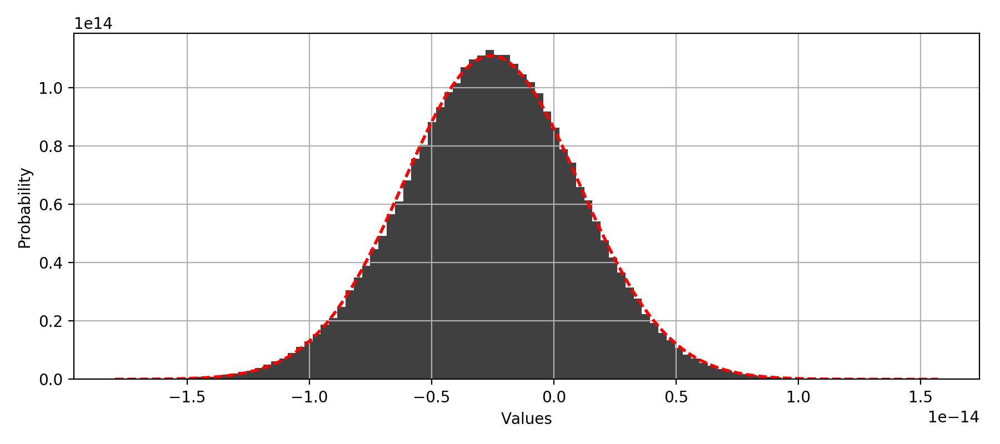

In [29]:
plt.figure()
plt.imshow(out_parameters[3,:,:]*1e15,vmin=-7,vmax=3)
plt.tight_layout()

(mu, sigma) = norm.fit(out_parameters[3,:,:][sel][(out_parameters[3,:,:][sel] > -15*1e-15) & (out_parameters[3,:,:][sel] < 15*1e-15)])
print (mu, sigma)

plt.figure(figsize=(9,4))
n, bins, patches = plt.hist(out_parameters[3,:,:][sel][(out_parameters[3,:,:][sel] > -5*sigma) & (out_parameters[3,:,:][sel] < 5*sigma)], 100, normed=1, facecolor='k', alpha=0.75)
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Values')
plt.ylabel('Probability')
plt.grid(True)
plt.tight_layout()

<IPython.core.display.Javascript object>


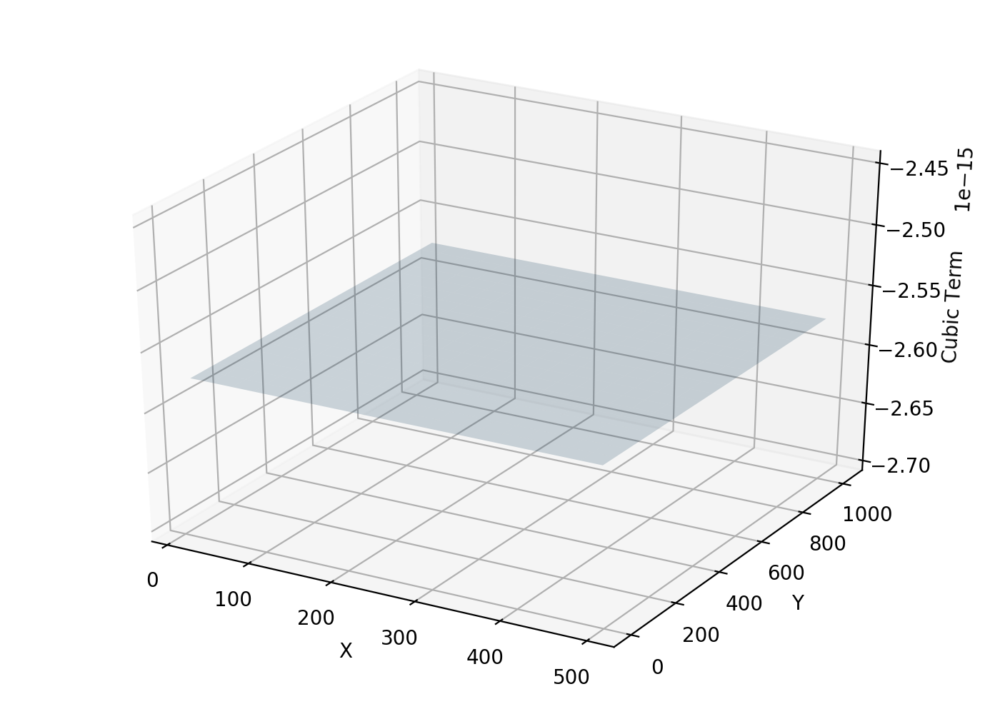

<IPython.core.display.Javascript object>


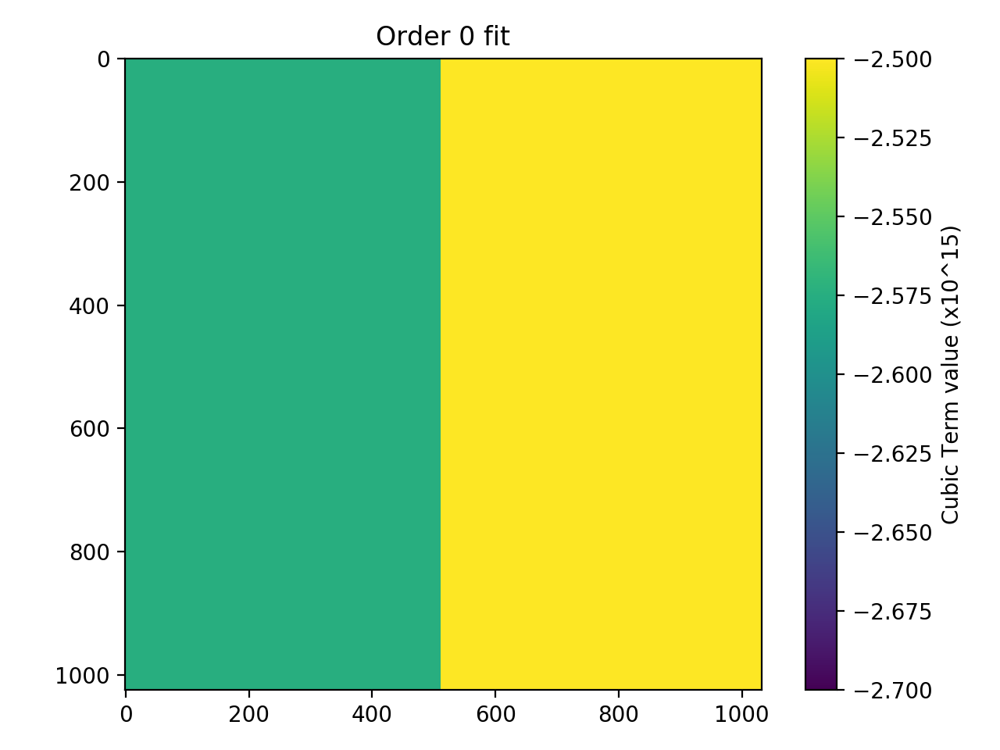

Order 0 fit cubic term value: -2.57432840608e-15


In [30]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[3,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,0)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Cubic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_CubicTermMap_allSlices_order0  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_CubicTermMap_allSlices_order0[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 0 fit')
plt.imshow(new_CubicTermMap_allSlices_order0*1e15,vmin=-2.7,vmax=-2.5)
clb = plt.colorbar()
clb.set_label('Cubic Term value (x10^15)')
plt.tight_layout()

print 'Order 0 fit cubic term value: {}'.format(new_CubicTermMap_allSlices_order0[100,100])

<IPython.core.display.Javascript object>


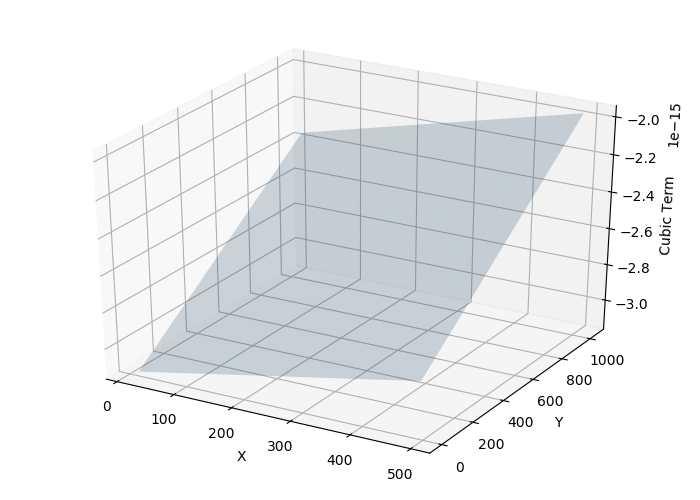

<IPython.core.display.Javascript object>


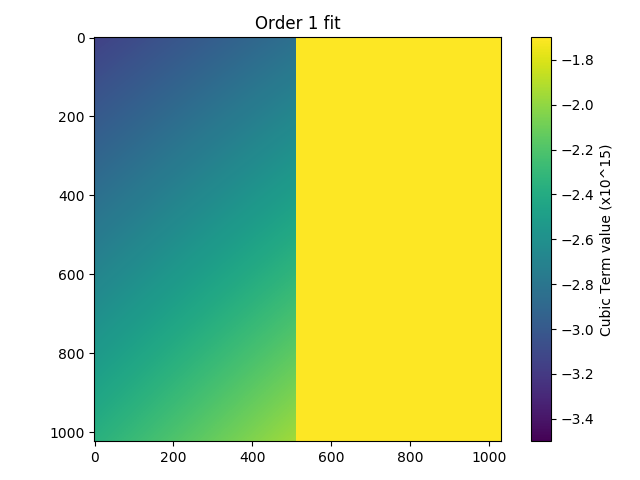

In [55]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[3,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Cubic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_CubicTermMap_allSlices_order1  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_CubicTermMap_allSlices_order1[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 1 fit')
plt.imshow(new_CubicTermMap_allSlices_order1*1e15,vmin=-3.5,vmax=-1.7)
clb = plt.colorbar()
clb.set_label('Cubic Term value (x10^15)')
plt.tight_layout()

<IPython.core.display.Javascript object>


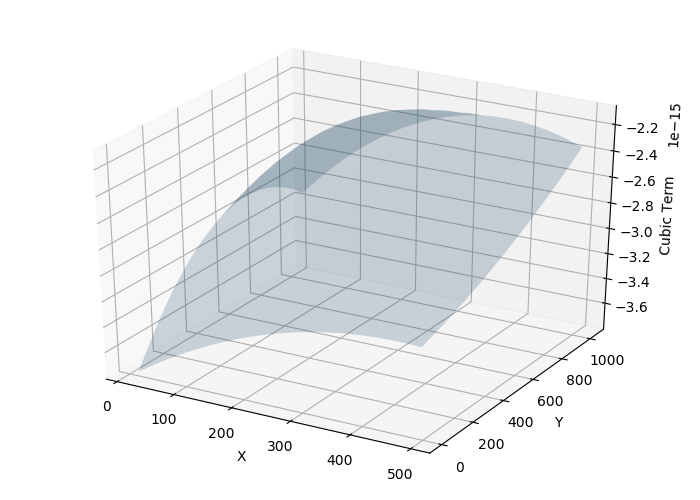

<IPython.core.display.Javascript object>


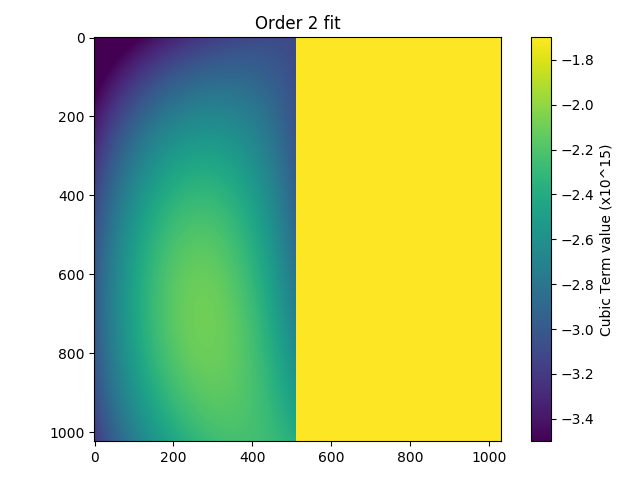

In [56]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[3,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Cubic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_CubicTermMap_allSlices_order2  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_CubicTermMap_allSlices_order2[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 2 fit')
plt.imshow(new_CubicTermMap_allSlices_order2*1e15,vmin=-3.5,vmax=-1.7)
clb = plt.colorbar()
clb.set_label('Cubic Term value (x10^15)')
plt.tight_layout()

<IPython.core.display.Javascript object>


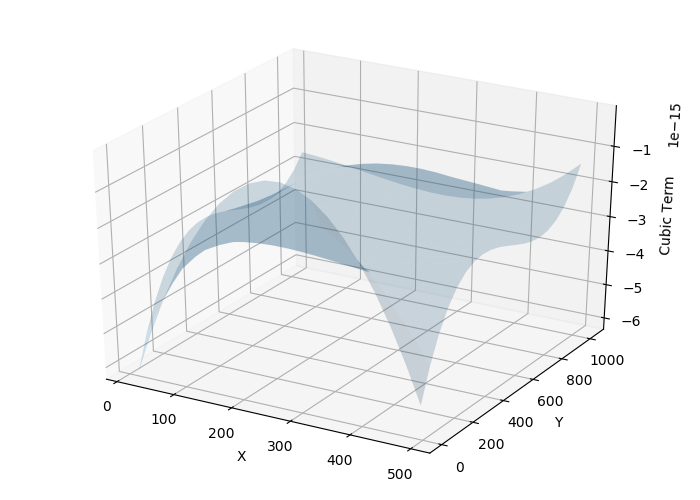

<IPython.core.display.Javascript object>


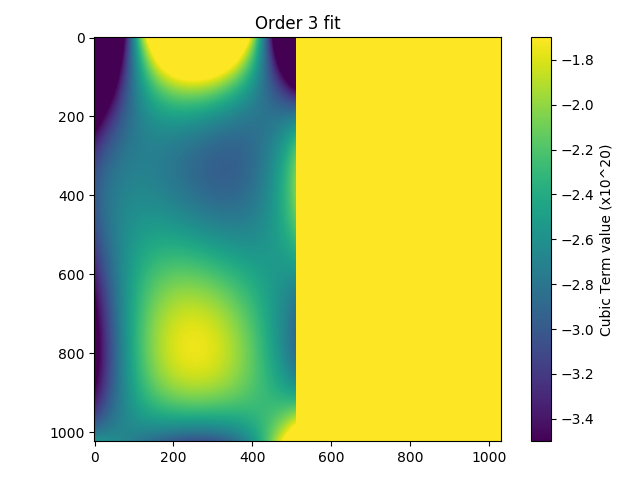

In [59]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[3,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,3)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Cubic Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_CubicTermMap_allSlices_order3  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_CubicTermMap_allSlices_order3[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 3 fit')
plt.imshow(new_CubicTermMap_allSlices_order3*1e15,vmin=-3.5,vmax=-1.7)
clb = plt.colorbar()
clb.set_label('Cubic Term value (x10^20)')
plt.tight_layout()

(0.005733769729008596, 3.571315368513579)
(0.00391366310886955, 3.5719494692221843)
(0.0033728161423291123, 3.5645417607197794)
(-0.08404449709270341, 3.598608598175168)


<IPython.core.display.Javascript object>


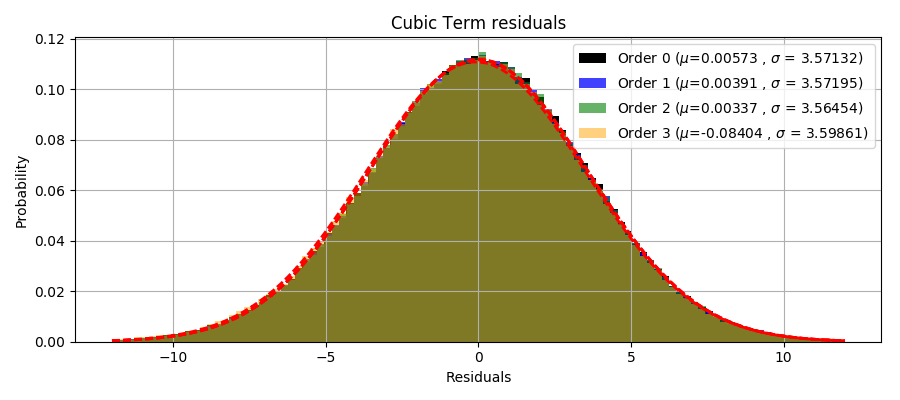

In [60]:
residuals_allSlices_order0 = (out_parameters[3,:,:][sel]-new_CubicTermMap_allSlices_order0[sel])*1e15
residuals_allSlices_order1 = (out_parameters[3,:,:][sel]-new_CubicTermMap_allSlices_order1[sel])*1e15
residuals_allSlices_order2 = (out_parameters[3,:,:][sel]-new_CubicTermMap_allSlices_order2[sel])*1e15
residuals_allSlices_order3 = (out_parameters[3,:,:][sel]-new_CubicTermMap_allSlices_order3[sel])*1e15

sel_allSlices_order0 = (residuals_allSlices_order0>=-12) & (residuals_allSlices_order0<=12)
sel_allSlices_order1 = (residuals_allSlices_order1>=-12) & (residuals_allSlices_order1<=12)
sel_allSlices_order2 = (residuals_allSlices_order2>=-12) & (residuals_allSlices_order2<=12)
sel_allSlices_order3 = (residuals_allSlices_order3>=-12) & (residuals_allSlices_order3<=12)

(mu_allSlices_order0, sigma_allSlices_order0) = norm.fit(residuals_allSlices_order1[sel_allSlices_order0])
(mu_allSlices_order1, sigma_allSlices_order1) = norm.fit(residuals_allSlices_order1[sel_allSlices_order1])
(mu_allSlices_order2, sigma_allSlices_order2) = norm.fit(residuals_allSlices_order2[sel_allSlices_order2])
(mu_allSlices_order3, sigma_allSlices_order3) = norm.fit(residuals_allSlices_order3[sel_allSlices_order3])

print (mu_allSlices_order0, sigma_allSlices_order0)
print (mu_allSlices_order1, sigma_allSlices_order1)
print (mu_allSlices_order2, sigma_allSlices_order2)
print (mu_allSlices_order3, sigma_allSlices_order3)

plt.figure(figsize=(9,4))
n_allSlices_order0, bins_allSlices_order0, patches_allSlices_order0 = plt.hist(residuals_allSlices_order0[sel_allSlices_order0], 100, normed=1, facecolor='k', alpha=1,label=r'Order 0 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order0,5), round(sigma_allSlices_order0,5) ))
n_allSlices_order1, bins_allSlices_order1, patches_allSlices_order1 = plt.hist(residuals_allSlices_order1[sel_allSlices_order1], 100, normed=1, facecolor='blue', alpha=0.75,label=r'Order 1 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order1,5), round(sigma_allSlices_order1,5) ))
n_allSlices_order2, bins_allSlices_order2, patches_allSlices_order2 = plt.hist(residuals_allSlices_order2[sel_allSlices_order2], 100, normed=1, facecolor='green', alpha=0.6,label='Order 2 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order2,5), round(sigma_allSlices_order2,5) ))
n_allSlices_order3, bins_allSlices_order3, patches_allSlices_order3 = plt.hist(residuals_allSlices_order3[sel_allSlices_order3], 100, normed=1, facecolor='orange', alpha=0.5,label='Order 3 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order3,5), round(sigma_allSlices_order3,5) ))
y_allSlices_order0 = mlab.normpdf(bins_allSlices_order0, mu_allSlices_order0, sigma_allSlices_order0)
y_allSlices_order1 = mlab.normpdf(bins_allSlices_order1, mu_allSlices_order1, sigma_allSlices_order1)
y_allSlices_order2 = mlab.normpdf(bins_allSlices_order2, mu_allSlices_order2, sigma_allSlices_order2)
y_allSlices_order3 = mlab.normpdf(bins_allSlices_order3, mu_allSlices_order3, sigma_allSlices_order3)
plt.plot(bins_allSlices_order0, y_allSlices_order0, 'r--', linewidth=2)
plt.plot(bins_allSlices_order1, y_allSlices_order1, 'r--', linewidth=2)
plt.plot(bins_allSlices_order2, y_allSlices_order2, 'r--', linewidth=2)
plt.plot(bins_allSlices_order3, y_allSlices_order3, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title('Cubic Term residuals')
plt.grid(True)
plt.legend()
plt.tight_layout()

# > Fit Fourth Order Term

<IPython.core.display.Javascript object>


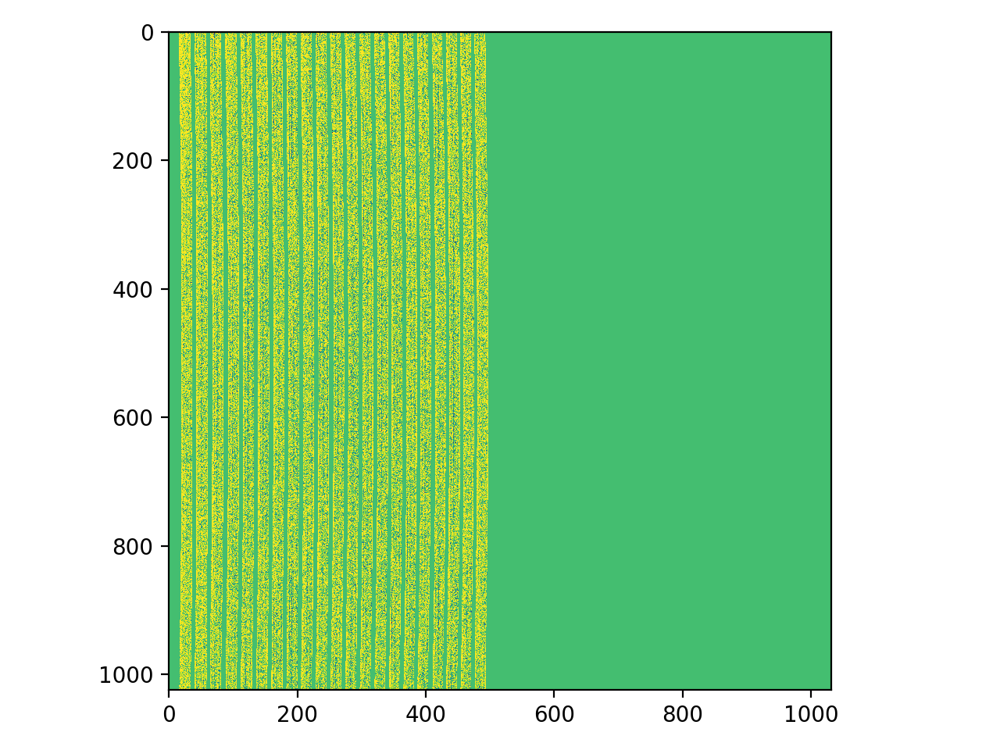

(1.8941154583236932e-20, 2.3671744939139016e-20)


<IPython.core.display.Javascript object>


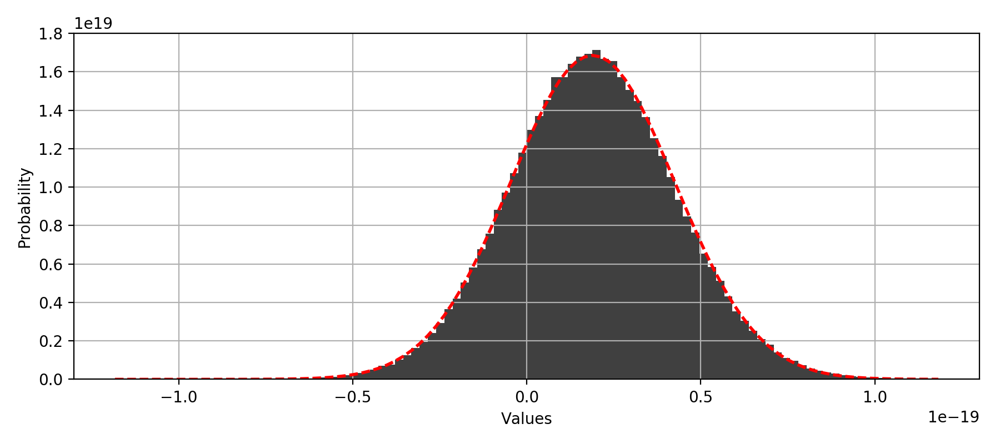

In [31]:
plt.figure()
plt.imshow(out_parameters[4,:,:]*1e20,vmin=-7,vmax=3)
plt.tight_layout()

(mu, sigma) = norm.fit(out_parameters[4,:,:][sel][(out_parameters[4,:,:][sel] > -7*1e-20) & (out_parameters[4,:,:][sel] < 10*1e-20)])
print (mu, sigma)

plt.figure(figsize=(9,4))
n, bins, patches = plt.hist(out_parameters[4,:,:][sel][(out_parameters[4,:,:][sel] > -5*sigma) & (out_parameters[4,:,:][sel] < 5*sigma)], 100, normed=1, facecolor='k', alpha=0.75)
y = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, y, 'r--', linewidth=2)
plt.xlabel('Values')
plt.ylabel('Probability')
plt.grid(True)
plt.tight_layout()

<IPython.core.display.Javascript object>


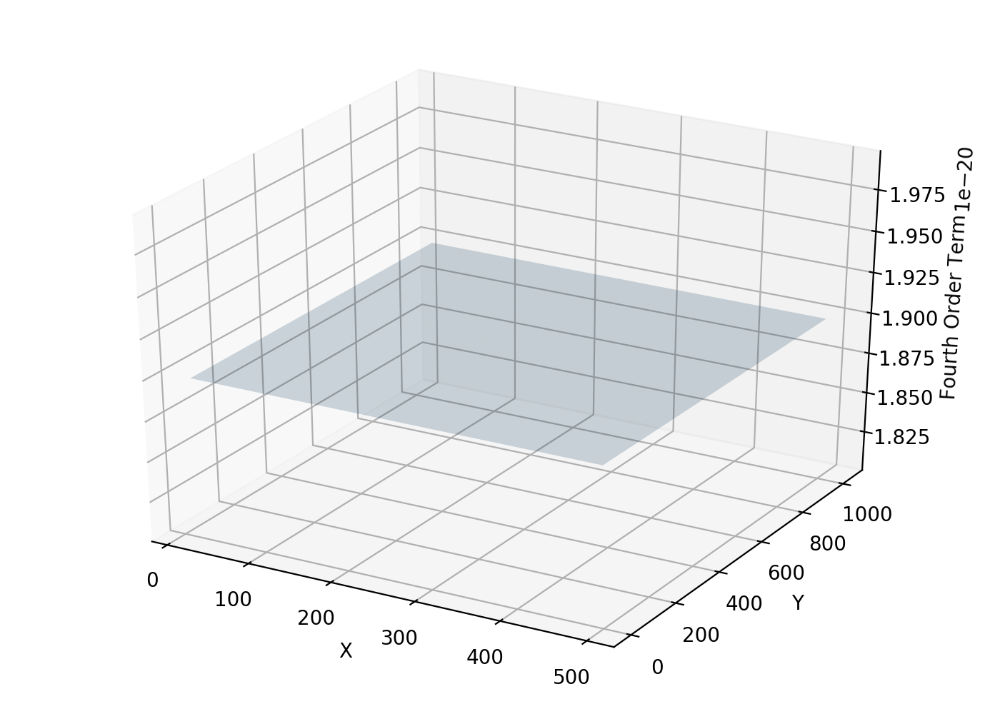

<IPython.core.display.Javascript object>


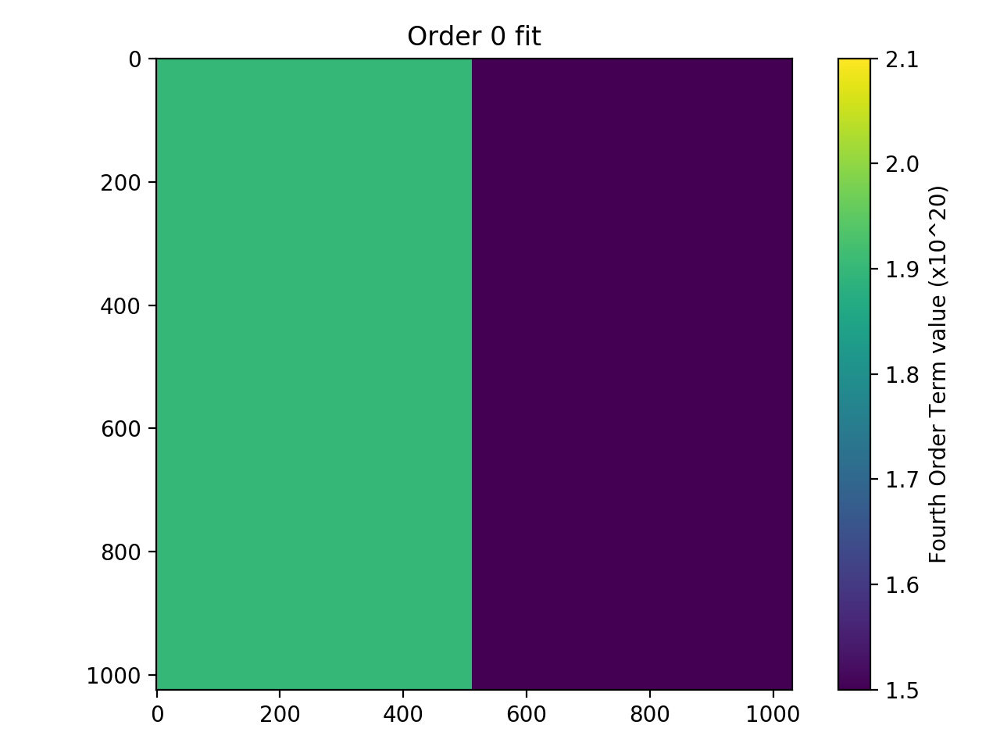

Order 0 fit fourth order term value: 1.89912762344e-20


In [32]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[4,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,0)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Fourth Order Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_FourthOrderTermMap_allSlices_order0  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_FourthOrderTermMap_allSlices_order0[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 0 fit')
plt.imshow(new_FourthOrderTermMap_allSlices_order0*1e20,vmin=1.5,vmax=2.1)
clb = plt.colorbar()
clb.set_label('Fourth Order Term value (x10^20)')
plt.tight_layout()

print 'Order 0 fit fourth order term value: {}'.format(new_FourthOrderTermMap_allSlices_order0[100,100])

<IPython.core.display.Javascript object>


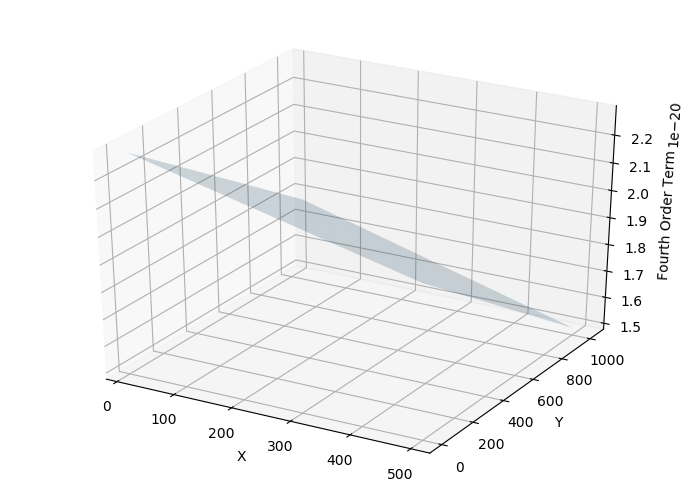

<IPython.core.display.Javascript object>


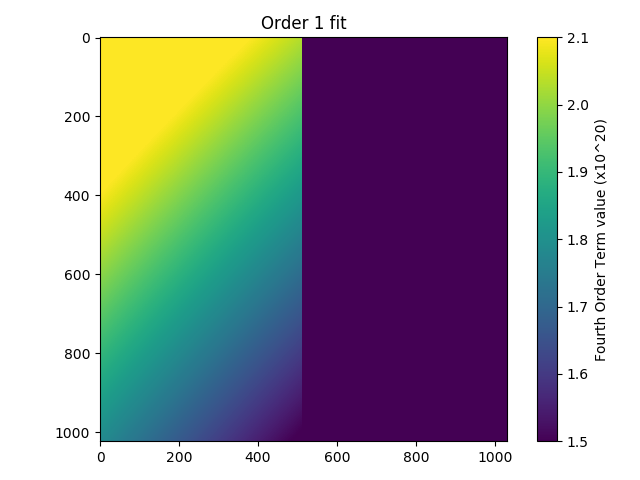

In [63]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[4,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,1)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Fourth Order Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_FourthOrderTermMap_allSlices_order1  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_FourthOrderTermMap_allSlices_order1[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 1 fit')
plt.imshow(new_FourthOrderTermMap_allSlices_order1*1e20,vmin=1.5,vmax=2.1)
clb = plt.colorbar()
clb.set_label('Fourth Order Term value (x10^20)')
plt.tight_layout()

<IPython.core.display.Javascript object>


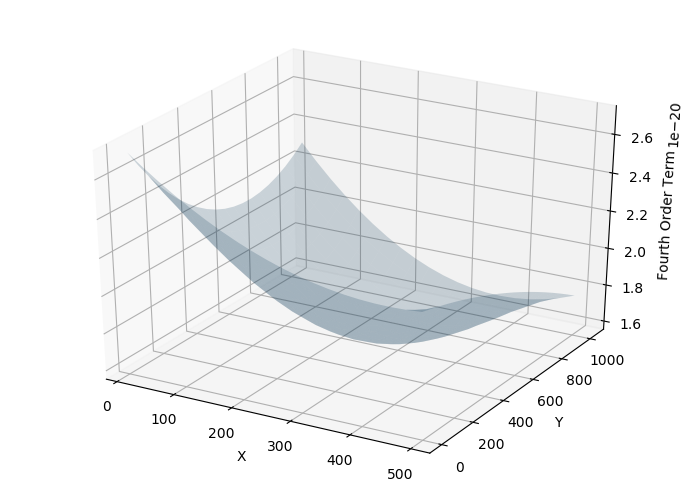

<IPython.core.display.Javascript object>


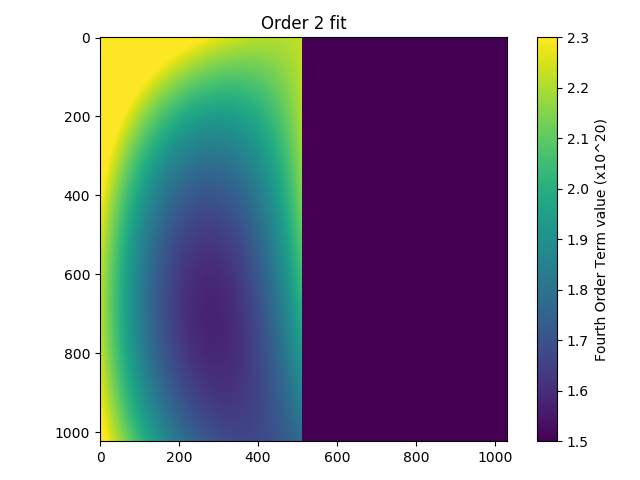

In [64]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[4,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,2)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Fourth Order Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_FourthOrderTermMap_allSlices_order2  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_FourthOrderTermMap_allSlices_order2[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 2 fit')
plt.imshow(new_FourthOrderTermMap_allSlices_order2*1e20,vmin=1.5,vmax=2.3)
clb = plt.colorbar()
clb.set_label('Fourth Order Term value (x10^20)')
plt.tight_layout()

<IPython.core.display.Javascript object>


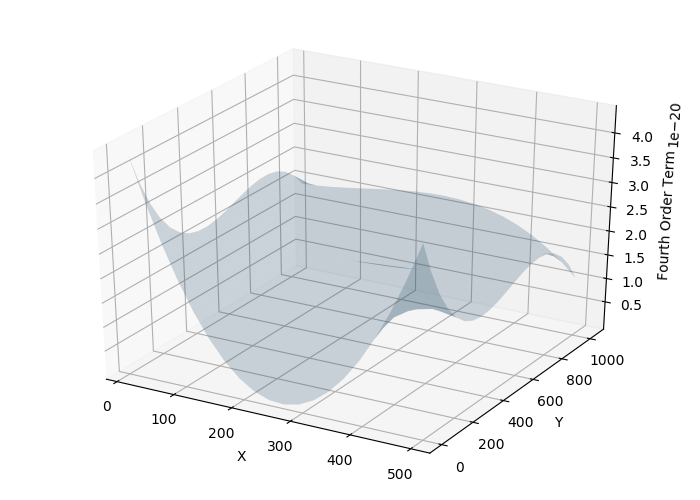

<IPython.core.display.Javascript object>


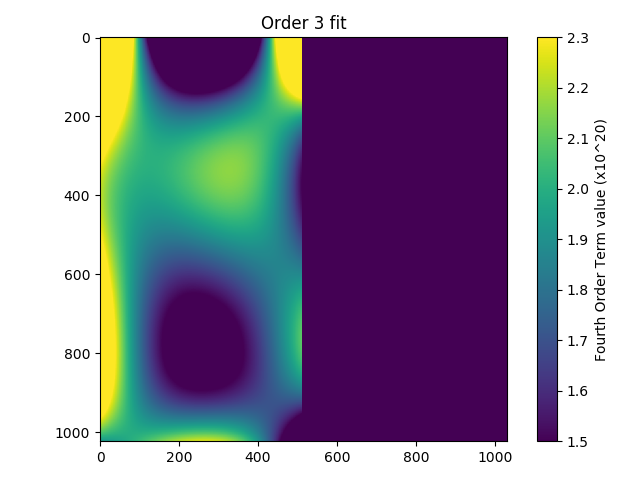

In [65]:
plt.close('all')
# Data for 2D polynomial fit:
sel = (d2cMaps['sliceMap'] > 100*int(band[0])) & (d2cMaps['sliceMap'] < 100*(int(band[0])+1) )
y,x = np.where(sel)
z = out_parameters[4,:,:][sel]

z[(z<mu-5*sigma)] = mu
z[(z>mu+5*sigma)] = mu

# Fit 2d polynomial to data
x_s = 512/2
try:
    m = funcs.polyfit2d(x_s,x,y,z,3)
except ValueError:
    raise ValueError, "FIT CRASHES FOR SLICE=" + str(islice)

if len(m) == 9:
    # 2D polynomial fit of order 2
    m = funcs.convert_m_order2_to_order4(m)

# Evaluate the 2D polynomial fit on a regular grid...
nx, ny = 20, 20
xx, yy = np.meshgrid(np.linspace(x.min(), x.max(), nx),
                     np.linspace(y.min(), y.max(), ny))
zz = funcs.polyval2d(x_s,xx, yy, m)

# plt.figure()
# plt.plot(zz[zz.shape[0]/2])
# plt.tight_layout()

fig = plt.figure(figsize=(7,5))
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, zz, rstride=1, cstride=1, alpha=0.2)
# ax.scatter(x,y, z,c=z)
plt.xlabel('X')
plt.ylabel('Y')
ax.set_zlabel('Fourth Order Term')
ax.axis('equal')
ax.axis('tight')
plt.tight_layout()

channel = int(band[0])
new_FourthOrderTermMap_allSlices_order3  = np.zeros(d2cMaps['sliceMap'].shape)

# create placeholder and identify pixels in slice
x,y = np.arange(512),np.arange(1024)
pixelCtrx,pixelCtry = np.meshgrid(x,y)

# apply the 2D polynomial transform
new_FourthOrderTermMap_allSlices_order3[pixelCtry,pixelCtrx] = funcs.polyval2d(x_s,pixelCtrx, pixelCtry, m)

plt.figure()
plt.title('Order 3 fit')
plt.imshow(new_FourthOrderTermMap_allSlices_order3*1e20,vmin=1.5,vmax=2.3)
clb = plt.colorbar()
clb.set_label('Fourth Order Term value (x10^20)')
plt.tight_layout()

(4.062499910743827e-06, 2.374221796034478)
(6.986232546050643e-05, 2.3742162220016065)
(3.779436122796085e-05, 2.369023813548407)
(0.06615603756605862, 2.399688255180627)


<IPython.core.display.Javascript object>


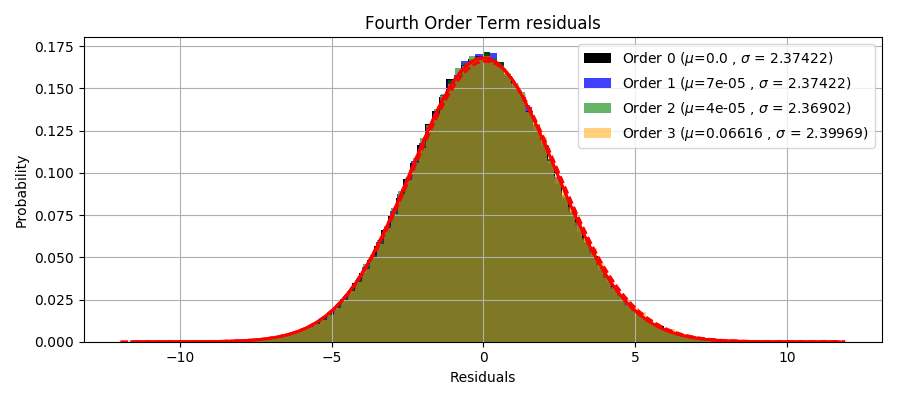

In [66]:
residuals_allSlices_order0 = (out_parameters[4,:,:][sel]-new_FourthOrderTermMap_allSlices_order0[sel])*1e20
residuals_allSlices_order1 = (out_parameters[4,:,:][sel]-new_FourthOrderTermMap_allSlices_order1[sel])*1e20
residuals_allSlices_order2 = (out_parameters[4,:,:][sel]-new_FourthOrderTermMap_allSlices_order2[sel])*1e20
residuals_allSlices_order3 = (out_parameters[4,:,:][sel]-new_FourthOrderTermMap_allSlices_order3[sel])*1e20

sel_allSlices_order0 = (residuals_allSlices_order0>=-12) & (residuals_allSlices_order0<=12)
sel_allSlices_order1 = (residuals_allSlices_order1>=-12) & (residuals_allSlices_order1<=12)
sel_allSlices_order2 = (residuals_allSlices_order2>=-12) & (residuals_allSlices_order2<=12)
sel_allSlices_order3 = (residuals_allSlices_order3>=-12) & (residuals_allSlices_order3<=12)

(mu_allSlices_order0, sigma_allSlices_order0) = norm.fit(residuals_allSlices_order1[sel_allSlices_order0])
(mu_allSlices_order1, sigma_allSlices_order1) = norm.fit(residuals_allSlices_order1[sel_allSlices_order1])
(mu_allSlices_order2, sigma_allSlices_order2) = norm.fit(residuals_allSlices_order2[sel_allSlices_order2])
(mu_allSlices_order3, sigma_allSlices_order3) = norm.fit(residuals_allSlices_order3[sel_allSlices_order3])

print (mu_allSlices_order0, sigma_allSlices_order0)
print (mu_allSlices_order1, sigma_allSlices_order1)
print (mu_allSlices_order2, sigma_allSlices_order2)
print (mu_allSlices_order3, sigma_allSlices_order3)

plt.figure(figsize=(9,4))
n_allSlices_order0, bins_allSlices_order0, patches_allSlices_order0 = plt.hist(residuals_allSlices_order0[sel_allSlices_order0], 100, normed=1, facecolor='k', alpha=1,label=r'Order 0 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order0,5), round(sigma_allSlices_order0,5) ))
n_allSlices_order1, bins_allSlices_order1, patches_allSlices_order1 = plt.hist(residuals_allSlices_order1[sel_allSlices_order1], 100, normed=1, facecolor='blue', alpha=0.75,label=r'Order 1 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order1,5), round(sigma_allSlices_order1,5) ))
n_allSlices_order2, bins_allSlices_order2, patches_allSlices_order2 = plt.hist(residuals_allSlices_order2[sel_allSlices_order2], 100, normed=1, facecolor='green', alpha=0.6,label='Order 2 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order2,5), round(sigma_allSlices_order2,5) ))
n_allSlices_order3, bins_allSlices_order3, patches_allSlices_order3 = plt.hist(residuals_allSlices_order3[sel_allSlices_order3], 100, normed=1, facecolor='orange', alpha=0.5,label='Order 3 ($\mu$={} , $\sigma$ = {})'.format(round(mu_allSlices_order3,5), round(sigma_allSlices_order3,5) ))
y_allSlices_order0 = mlab.normpdf(bins_allSlices_order0, mu_allSlices_order0, sigma_allSlices_order0)
y_allSlices_order1 = mlab.normpdf(bins_allSlices_order1, mu_allSlices_order1, sigma_allSlices_order1)
y_allSlices_order2 = mlab.normpdf(bins_allSlices_order2, mu_allSlices_order2, sigma_allSlices_order2)
y_allSlices_order3 = mlab.normpdf(bins_allSlices_order3, mu_allSlices_order3, sigma_allSlices_order3)
plt.plot(bins_allSlices_order0, y_allSlices_order0, 'r--', linewidth=2)
plt.plot(bins_allSlices_order1, y_allSlices_order1, 'r--', linewidth=2)
plt.plot(bins_allSlices_order2, y_allSlices_order2, 'r--', linewidth=2)
plt.plot(bins_allSlices_order3, y_allSlices_order3, 'r--', linewidth=2)
plt.xlabel('Residuals')
plt.ylabel('Probability')
plt.title('Fourth Order Term residuals')
plt.grid(True)
plt.legend()
plt.tight_layout()

# Choose best model for each parameter

In [33]:
best_parameters = np.zeros(out_parameters.shape)
best_parameters[0,:,:] = new_biasMap_allSlices_order0.copy()
best_parameters[1,:,:] = new_LinearTermMap_allSlices_order0.copy()
best_parameters[2,:,:] = new_QuadraticTermMap_allSlices_order0.copy()
best_parameters[3,:,:] = new_CubicTermMap_allSlices_order0.copy()
best_parameters[4,:,:] = new_FourthOrderTermMap_allSlices_order0.copy()


<IPython.core.display.Javascript object>


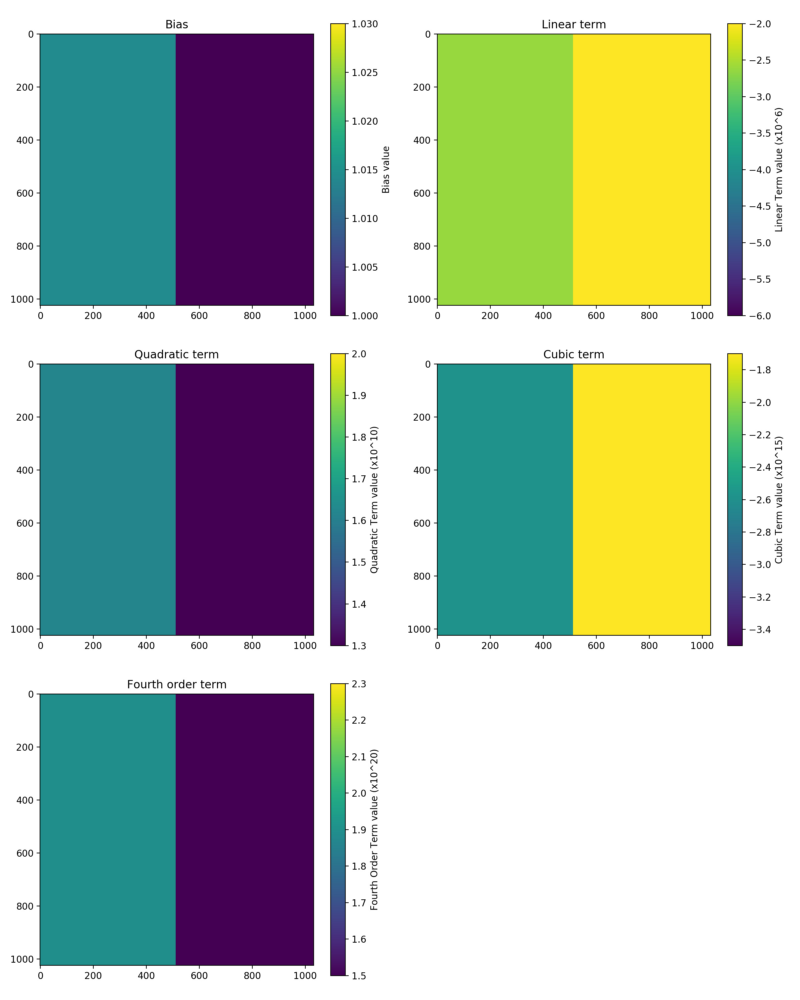

In [34]:
plt.close('all')
fig,axs = plt.subplots(3,2,figsize=(12,15))
z1_plot = axs[0,0].imshow(best_parameters[0,:,:],vmin=1,vmax=1.03)
axs[0,0].set_title('Bias')
fig.colorbar(z1_plot, ax=axs[0, 0],label='Bias value')
z2_plot = axs[0,1].imshow(best_parameters[1,:,:]*1e6,vmin=-6,vmax=-2)
axs[0,1].set_title('Linear term')
fig.colorbar(z2_plot, ax=axs[0, 1],label='Linear Term value (x10^6)')
z3_plot = axs[1,0].imshow(best_parameters[2,:,:]*1e10,vmin=1.3,vmax=2)
axs[1,0].set_title('Quadratic term')
fig.colorbar(z3_plot, ax=axs[1, 0],label='Quadratic Term value (x10^10)')
z4_plot = axs[1,1].imshow(best_parameters[3,:,:]*1e15,vmin=-3.5,vmax=-1.7)
axs[1,1].set_title('Cubic term')
fig.colorbar(z4_plot, ax=axs[1, 1],label='Cubic Term value (x10^15)')
z5_plot = axs[2,0].imshow(best_parameters[4,:,:]*1e20,vmin=1.5,vmax=2.3)
axs[2,0].set_title('Fourth order term')
fig.colorbar(z5_plot, ax=axs[2, 0],label='Fourth Order Term value (x10^20)')
fig.delaxes(axs[2][1])
plt.tight_layout()

In [69]:
outfile = 'NonLinearityCorrection_OutputParameters_BestModel_CV3_MRS_RAD_14_Band{}'.format(band)
np.save(outfile, best_parameters)

In [ ]:
# best_parameters = np.load(outfile)